In [ ]:
# Mount Google Drive (for saving outputs)
from google.colab import drive
drive.mount('/content/drive')

# Install required packages
%pip install torch torchvision
%pip install yacs albumentations opencv-python matplotlib pandas pillow scikit-image
%pip install pytorch-msssim opencv-contrib-python requests
%pip install gdown  # For downloading datasets
%pip install scikit-learn tqdm


Mounted at /content/drive


In [ ]:
# Option 1: Clone from GitHub
!git clone https://github.com/ronakgadhiya09/rooftop-solar-potential.git
%cd rooftop-solar-potential

Cloning into 'rooftop-solar-potential'...
remote: Enumerating objects: 1156, done.
remote: Counting objects: 100% (641/641), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 1156 (delta 514), reused 635 (delta 508), pack-reused 515 (from 1)
Receiving objects: 100% (1156/1156), 201.32 MiB | 29.63 MiB/s, done.
Resolving deltas: 100% (515/515), done.
Updating files: 100% (1104/1104), done.
/content/rooftop-solar-potential


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class SimpleCNNRegressor(nn.Module):
    def __init__(self, num_classes=1):
        super(SimpleCNNRegressor, self).__init__()
        # Simple CNN layers
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1) # Input channels: 3 for RGB
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout = nn.Dropout(0.5) # Add dropout for regularization

        # Calculate the size of the flattened layer after convolutions and pooling
        # Assuming input image size is 128x128 after resizing
        # After 3 pooling layers (each reduces size by half): 128 / 2 / 2 / 2 = 16
        # Output channels from last conv layer: 128
        self._to_linear = 128 * 16 * 16 # This needs to be calculated based on input size and layers

        # A more robust way to calculate _to_linear: pass a dummy tensor
        # self._to_linear = self._get_conv_output((3, 128, 128))


        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes) # Output layer for regression (1 output)

    def _get_conv_output(self, shape):
        # Helper function to calculate the output size of convolutional layers
        bs = 1
        input = torch.autograd.Variable(torch.rand(bs, *shape))
        output_feat = self._forward_features(input)
        n_size = output_feat.data.view(bs, -1).size(1)
        return n_size

    def _forward_features(self, x):
        # Helper function to pass through convolutional layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        return x


    def forward(self, x):
        # Forward pass through the network
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Flatten the output for the fully connected layers
        x = x.view(-1, self._to_linear) # Use the calculated size

        x = F.relu(self.fc1(x))
        x = self.dropout(x) # Apply dropout
        x = self.fc2(x) # Output layer (no activation for regression)
        return x

# Instantiate the model
model = SimpleCNNRegressor()
print(model)

# Calculate the actual _to_linear size using a dummy tensor
# This is safer than hardcoding if input size or layers change
dummy_input = torch.randn(1, 3, 128, 128) # Batch size 1, 3 channels, 128x128 image
# Pass through the feature extraction part to get the flattened size
dummy_output = model._forward_features(dummy_input)
calculated_to_linear = dummy_output.view(1, -1).size(1)

# Update the model's _to_linear attribute and re-instantiate the model
# This is a bit clunky, a better approach is to calculate this in __init__
# using the _get_conv_output helper, but this demonstrates the calculation.
# For simplicity in this step, we'll just print the calculated size.
print(f"Calculated size before linear layers: {calculated_to_linear}")

# Note: In a real scenario, you would typically integrate the _get_conv_output
# calculation within the __init__ method to set self._to_linear dynamically
# based on the input size. For this step, we just define the model and print the size.

SimpleCNNRegressor(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=32768, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
)
Calculated size before linear layers: 32768


In [ ]:
# Download pre-trained model weights
!gdown --folder https://drive.google.com/drive/folders/1RmPxBfePZctk_RLSwMcZFcjqx4HxDiI7 -O Solar_Potential_Estimation/i_outputs

# Check if weights were downloaded successfully
import os
if os.path.exists('Solar_Potential_Estimation/i_outputs/epoch_99.pth'):
    print("✅ Pre-trained weights downloaded successfully")
else:
    print("❌ Failed to download pre-trained weights")
    print("Please download manually from: https://drive.google.com/drive/folders/1RmPxBfePZctk_RLSwMcZFcjqx4HxDiI7")


Retrieving folder contents
Processing file 1e1kmqtQIP1BZjuBG17Zw2HPlHitP5TJv epoch_99.pth
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From (original): https://drive.google.com/uc?id=1e1kmqtQIP1BZjuBG17Zw2HPlHitP5TJv
From (redirected): https://drive.google.com/uc?id=1e1kmqtQIP1BZjuBG17Zw2HPlHitP5TJv&confirm=t&uuid=fc0fae77-e7f1-415f-b041-fece9acfdac7
To: /content/rooftop-solar-potential/Solar_Potential_Estimation/i_outputs/epoch_99.pth
100% 571M/571M [00:11<00:00, 49.6MB/s]
Download completed
✅ Pre-trained weights downloaded successfully


In [ ]:
# Download a sample test image from the dataset
# You can replace this with your own aerial image
!cp Solar_Potential_Estimation/india_dataset/twoChannels_in/val/images/25_6.png Solar_Potential_Estimation/test_crowd/images/

# Alternatively, upload your own image
from google.colab import files
print("You can also upload your own aerial image:")
# Uncomment the line below to upload your own image
# uploaded = files.upload()

# If you uploaded an image, save it to the test directory
"""
import shutil
for filename in uploaded.keys():
    shutil.move(filename, f'Solar_Potential_Estimation/test_crowd/images/{filename}')
    print(f"Saved {filename} to test directory")
"""


You can also upload your own aerial image:


'\nimport shutil\nfor filename in uploaded.keys():\n    shutil.move(filename, f\'Solar_Potential_Estimation/test_crowd/images/{filename}\')\n    print(f"Saved {filename} to test directory")\n'

In [ ]:
import os
import sys
import numpy as np
import torch
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Add project directories to path
sys.path.append('Solar_Potential_Estimation')
from model.seg_hrnet_ocr import get_seg_model
from lib.config import config

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Set paths
CONFIG_PATH = 'Solar_Potential_Estimation/configs/inria_hrnet_ocr.yaml'
CHECKPOINT_PATH = 'Solar_Potential_Estimation/i_outputs/epoch_99.pth'
IMAGE_DIR = 'Solar_Potential_Estimation/test_crowd/images'
OUTPUT_DIR = 'Solar_Potential_Estimation/test_crowd/pred'
MASKS_DIR = 'Solar_Potential_Estimation/test_crowd/masks'

# Create output directory if it doesn't exist
os.makedirs(OUTPUT_DIR, exist_ok=True)
os.makedirs(MASKS_DIR, exist_ok=True)


Using device: cuda


In [ ]:
from yacs.config import CfgNode as CN # Import CfgNode

# Load configuration directly from the YAML file
with open(CONFIG_PATH, 'r') as f:
    cfg = CN.load_cfg(f) # Load configuration directly

# Modify the config to prevent the model from loading pretrained weights during initialization
# We are loading weights separately in this notebook cell
cfg.defrost()
cfg.MODEL.PRETRAINED = ''  # Set PRETRAINED to an empty string or None
cfg.freeze()


# Initialize model
model = get_seg_model(cfg)
model = model.to(device)

# Load pre-trained weights
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
# Load only the model's state dictionary
if 'model_state_dict' in checkpoint:
    model.load_state_dict(checkpoint['model_state_dict'])
elif 'state_dict' in checkpoint: # Keep the original check in case the key name varies
     model.load_state_dict(checkpoint['state_dict'])
else:
    # Fallback to loading the entire checkpoint if neither expected key is found
    model.load_state_dict(checkpoint)

# Set model to evaluation mode
model.eval()
print("Model loaded successfully!")

Model loaded successfully!


In [ ]:
def preprocess_image(image_path):
    """
    Preprocess an image for inference
    """
    # Define transforms
    transform = A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
    ])

    # Load image
    image = np.array(Image.open(image_path).convert('RGB')).astype(np.uint8)

    # Apply transforms
    transformed = transform(image=image)
    image_tensor = transformed['image']

    # Add batch dimension
    image_tensor = image_tensor.unsqueeze(0)

    return image_tensor, image

def postprocess_output(output, threshold=0.5):
    """
    Convert model output to binary mask
    """
    # Apply sigmoid and threshold
    pred = torch.sigmoid(output)
    pred = (pred > threshold).float()

    # Convert to numpy
    pred = pred.cpu().numpy()

    return pred[0, 0]  # Return first image, first channel


Found 1 test images
Processing 25_6.png...


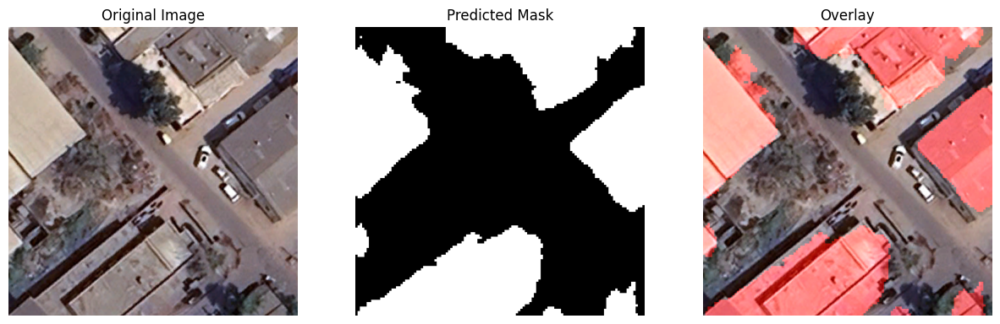

✅ Saved prediction for 25_6.png
Inference complete!


In [ ]:
# Get list of test images
test_images = os.listdir(IMAGE_DIR)
print(f"Found {len(test_images)} test images")

# Process each image
for img_name in test_images:
    # Skip non-image files
    if not (img_name.endswith('.png') or img_name.endswith('.jpg') or img_name.endswith('.jpeg')):
        continue

    print(f"Processing {img_name}...")
    img_path = os.path.join(IMAGE_DIR, img_name)

    # Preprocess image
    image_tensor, original_image = preprocess_image(img_path)
    image_tensor = image_tensor.to(device)

    # Run inference
    with torch.no_grad():
        output = model(image_tensor)

    # Postprocess output
    # Access the main output tensor from the dictionary
    if isinstance(output, dict) and 'main_out' in output:
        pred_mask = postprocess_output(output['main_out'])
    else:
        # Fallback in case the output structure is different
        pred_mask = postprocess_output(output)

    # Resize predicted mask to match original image dimensions for visualization
    pred_mask_resized = cv2.resize(pred_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)


    # Save prediction mask as numpy array
    mask_filename = os.path.join(MASKS_DIR, img_name.replace('.png', '.npy').replace('.jpg', '.npy').replace('.jpeg', '.npy'))
    np.save(mask_filename, pred_mask)

    # Create visualization
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')

    # Prediction mask
    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask_resized, cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    # Overlay
    plt.subplot(1, 3, 3)
    overlay = original_image.copy()
    overlay_mask = np.zeros_like(original_image)
    # Use the resized mask for the overlay
    overlay_mask[:, :, 0] = pred_mask_resized * 255  # Red channel
    alpha = 0.5
    cv2_overlay = cv2.addWeighted(original_image, 1, overlay_mask, alpha, 0)
    plt.imshow(cv2_overlay)
    plt.title('Overlay')
    plt.axis('off')

    # Save visualization
    vis_filename = os.path.join(OUTPUT_DIR, img_name.replace('.png', '_.png').replace('.jpg', '_.png').replace('.jpeg', '_.png'))
    plt.savefig(vis_filename)
    plt.show() # Display the plot
    plt.close()

    print(f"✅ Saved prediction for {img_name}")

print("Inference complete!")

In [ ]:
import os
import json
import math
import requests
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from datetime import datetime, UTC
from typing import Tuple, List, Dict

# -------------------------
# CONFIG - edit as needed
# -------------------------
MASKS_DIR = "Solar_Potential_Estimation/test_crowd/masks"         # directory with per-image .npy binary masks (0/1)
IMAGE_DIR = "Solar_Potential_Estimation/test_crowd/images"        # directory with original images (png/jpg) (optional but recommended)
OUT_DIR = "Solar_Potential_Estimation/output"          # top-level output directory (will be created)
PVGIS_LAT = 26.2389           # example: Jodhpur
PVGIS_LON = 73.0243
PVGIS_YEAR = None             # None => latest available / PVGIS defaults
METERS_PER_PIXEL = 0.02       # meters represented by one pixel in the mask. Adjust if you know GSD.
MIN_ROOF_AREA_PIXELS = 75     # ignore tiny components
PANEL_AREA_M2 = 1.7           # typical panel footprint area in m² (adjust if you want)
PANEL_PEAK_KWP = 0.32         # typical panel nominal power in kWp (0.32 for 320W)
PVGIS_TIMEOUT = 10            # seconds for API call
GENERATE_HEATMAP = True       # whether to save per-image heatmap visualization
# -------------------------

# create dirs
os.makedirs(OUT_DIR, exist_ok=True)
COMPONENTS_DIR = os.path.join(OUT_DIR, "components")
ROOF_DATA_DIR = os.path.join(OUT_DIR, "roof_data")
TOTAL_PON_DIR = os.path.join(OUT_DIR, "total_pon")
COM_BIN_DIR = os.path.join(OUT_DIR, "com_bin")
HEATMAP_DIR = os.path.join(OUT_DIR, "heatmap")
JSON_DIR = os.path.join(OUT_DIR, "solar_power_json")

for d in (COMPONENTS_DIR, ROOF_DATA_DIR, TOTAL_PON_DIR, COM_BIN_DIR, JSON_DIR, HEATMAP_DIR):
    os.makedirs(d, exist_ok=True)


# -------------------------
# PVGIS helper
# -------------------------
def get_pvgis_annual(lat: float, lon: float, year: int = None, timeout: int = PVGIS_TIMEOUT) -> float:
    """
    Query PVGIS to obtain annual production per kWp (kWh/kWp/year).
    Uses the PVcalc v5_3 endpoint (returns JSON). Returns fallback default if request fails.
    """
    url = "https://re.jrc.ec.europa.eu/api/v5_3/PVcalc"
    params = {
        "lat": lat,
        "lon": lon,
        "peakpower": 1,
        "loss": 14,
        "angle": 30,
        "fixed": 1,
        "aspect": 0,
        "pvtechchoice": "crystSi",
        "mountingplace": "building",
        "outputformat": "json",
    }
    if year:
        params["startyear"] = year
        params["endyear"] = year

    try:
        r = requests.get(url, params=params, timeout=timeout)
        r.raise_for_status()
        data = r.json()
        # Save copy
        ts = datetime.now(UTC).strftime("%Y%m%dT%H%M%SZ")
        with open(os.path.join(JSON_DIR, f"pvgis_{lat}_{lon}_{ts}.json"), "w") as f:
            json.dump(data, f, indent=2)

        # Try several possible key paths for annual energy
        annual = None
        if "outputs" in data:
            tots = data["outputs"].get("totals", {})
            # try common shapes:
            # v5_3 sometimes: outputs.totals.E_y
            if "E_y" in tots:
                annual = tots["E_y"]
            else:
                # fixed mount variant e.g. outputs.totals.fixed.E_y
                fixed = tots.get("fixed", {})
                if "E_y" in fixed:
                    annual = fixed["E_y"]
        if annual is None:
            raise KeyError("Annual production key not found in PVGIS response.")
        print(f"[PVGIS] Using annual production: {annual:.2f} kWh/kWp (lat={lat}, lon={lon})")
        return float(annual)
    except Exception as e:
        # fallback default (India-like average)
        fallback = 1600.0
        print(f"[PVGIS] Warning: failed to fetch PVGIS data ({e}). Using fallback {fallback} kWh/kWp.")
        return fallback


# -------------------------
# Roof separation and area estimation
# -------------------------
def process_mask_file(mask_path: str,
                      image_dir: str,
                      meters_per_pixel: float = METERS_PER_PIXEL,
                      min_area_px: int = MIN_ROOF_AREA_PIXELS,
                      panel_area_m2: float = PANEL_AREA_M2,
                      panel_peak_kwp: float = PANEL_PEAK_KWP,
                      annual_kwh_per_kwp: float = 1600.0) -> Tuple[np.ndarray, np.ndarray, List[Dict], float]:
    """
    Process one binary mask .npy file and its original image (if present).
    Returns: labeled_mask_resized, visualization_rgb, roof_data(list of dict), total_potential_kwh_per_year
    """
    # Load mask (expected binary 0/1 or 0/255)
    mask = np.load(mask_path)
    if mask.dtype != np.uint8:
        mask = (mask > 0).astype(np.uint8)

    mask_h, mask_w = mask.shape[:2]

    # Try to find the corresponding original image (same base name) in image_dir
    base = os.path.splitext(os.path.basename(mask_path))[0]
    image_path = None
    if image_dir:
        for ext in (".png", ".jpg", ".jpeg"):
            p = os.path.join(image_dir, base + ext)
            if os.path.exists(p):
                image_path = p
                break

    # If no original image, create a dummy original of same resolution (for visualization sizing)
    if image_path:
        orig = cv2.imread(image_path)
        if orig is None:
            print(f"[WARN] Could not load image {image_path}. Using mask size for visualization.")
            orig = np.zeros((mask_h, mask_w, 3), dtype=np.uint8)
        else:
            orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    else:
        orig = np.zeros((mask_h, mask_w, 3), dtype=np.uint8)

    orig_h, orig_w = orig.shape[:2]

    # Label connected components (use cv2.connectedComponentsWithStats for stats)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask.astype(np.uint8), connectivity=8)

    # Resize labels array to match original image dimensions for visualization
    labels_resized = cv2.resize(labels.astype(np.uint8), (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

    # prepare outputs
    roof_data = []
    vis_image = np.zeros_like(orig, dtype=np.uint8)

    # compute area scale factor if mask and orig sizes differ
    area_scale = (orig_h * orig_w) / (mask_h * mask_w) if (mask_h * mask_w > 0) else 1.0

    total_potential = 0.0

    for label_id in range(1, num_labels):  # skip background 0
        area_px = int(stats[label_id, cv2.CC_STAT_AREA])
        if area_px < min_area_px:
            continue

        # scaled area in pixels to original image pixels (if mask was downsampled)
        scaled_px = area_px * area_scale

        # convert to square meters using meters_per_pixel (meters for ONE PIXEL in mask resolution)
        # If mask was downsampled we already scaled to original pixel count above.
        real_area_m2 = scaled_px * (meters_per_pixel ** 2)

        # estimate number of panels and peak power
        num_panels = int(real_area_m2 // panel_area_m2)
        peak_kwp = num_panels * panel_peak_kwp
        annual_kwh = peak_kwp * annual_kwh_per_kwp  # kWh/year

        total_potential += annual_kwh

        # color for visualization using the resized labels array
        color = tuple(int(c) for c in np.random.randint(40, 240, size=3))
        vis_image[labels_resized == label_id] = color

        # draw label id text roughly at centroid (ensure int and in bounds)
        cx, cy = centroids[label_id]
        # Scale centroid coordinates to match original image dimensions
        cx_scaled = int(cx * (orig_w / mask_w))
        cy_scaled = int(cy * (orig_h / mask_h))

        if 0 <= cy_scaled < vis_image.shape[0] and 0 <= cx_scaled < vis_image.shape[1]:
            cv2.putText(vis_image, str(label_id), (cx_scaled, cy_scaled),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

        roof_data.append({
            "Roof_ID": int(label_id),
            "Roof_Area_Px_mask": int(area_px),
            "Roof_Area_Px_scaled": int(round(scaled_px)),
            "Real_Area_m2": float(round(real_area_m2, 3)),
            "Panels": int(num_panels),
            "Peak_kwp": float(round(peak_kwp, 3)),
            "Solar_potential_kwh_per_year": float(round(annual_kwh, 3))
        })

    return labels_resized, vis_image, roof_data, float(total_potential)


# -------------------------
# Heatmap utility (optional)
# -------------------------
def save_heatmap_from_roof_data(labeled_mask: np.ndarray, roof_data: List[Dict], out_path: str):
    """
    Create a normalized heatmap of annual solar potential per roof and save to out_path.
    labeled_mask: integer-labeled mask (same shape as heatmap)
    roof_data: list of dicts containing 'Roof_ID' and 'Solar_potential_kwh_per_year'
    """
    if len(roof_data) == 0:
        print(f"[HEATMAP] No roof data to map for {out_path}")
        return

    # create mapping
    pot_map = {int(d["Roof_ID"]): float(d["Solar_potential_kwh_per_year"]) for d in roof_data}
    heat = np.zeros_like(labeled_mask, dtype=float)
    for rid, val in pot_map.items():
        heat[labeled_mask == rid] = val

    # normalize safely
    mn = heat.min()
    mx = heat.max()
    if mx - mn <= 1e-9:
        norm = np.zeros_like(heat)
    else:
        norm = (heat - mn) / (mx - mn)

    cmap = LinearSegmentedColormap.from_list("solar", ["yellow", "red"])
    plt.figure(figsize=(8, 8))
    plt.imshow(norm, cmap=cmap)
    cbar = plt.colorbar(label="Normalized annual potential")
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close()


# -------------------------
# Main processing loop
# -------------------------
def main():
    print("[INFO] Starting solar potential estimation pipeline")
    annual_kwh_per_kwp = get_pvgis_annual(PVGIS_LAT, PVGIS_LON, PVGIS_YEAR)

    # iterate mask files
    mask_files = [f for f in os.listdir(MASKS_DIR) if f.lower().endswith(".npy")]
    if not mask_files:
        print(f"[WARN] No .npy mask files found in {MASKS_DIR}")
        return

    for mask_fname in mask_files:
        mask_path = os.path.join(MASKS_DIR, mask_fname)
        base = os.path.splitext(mask_fname)[0]
        print(f"[PROCESS] {base}")

        labeled_mask_resized, vis_image, roof_data, total_potential = process_mask_file(
            mask_path=mask_path,
            image_dir=IMAGE_DIR,
            meters_per_pixel=METERS_PER_PIXEL,
            min_area_px=MIN_ROOF_AREA_PIXELS,
            panel_area_m2=PANEL_AREA_M2,
            panel_peak_kwp=PANEL_PEAK_KWP,
            annual_kwh_per_kwp=annual_kwh_per_kwp,
        )

        # Save labeled mask (resized) as .npy
        np.save(os.path.join(COM_BIN_DIR, f"{base}.npy"), labeled_mask_resized.astype(np.uint8))

        # Save visualization image (RGB)
        plt.figure(figsize=(8, 8))
        plt.imshow(vis_image)
        plt.axis("off")
        plt.tight_layout()
        plt.savefig(os.path.join(COMPONENTS_DIR, f"{base}.png"), dpi=300, bbox_inches="tight")
        plt.close()

        # Save per-roof CSV
        df = pd.DataFrame(roof_data)
        df.to_csv(os.path.join(ROOF_DATA_DIR, f"{base}.csv"), index=False)

        # Save total potential text
        with open(os.path.join(TOTAL_PON_DIR, f"{base}.txt"), "w") as f:
            f.write(f"Total Solar Potential (kWh/year): {total_potential:.3f}\n")
            f.write(f"Parameters: panel_area_m2={PANEL_AREA_M2}, panel_peak_kwp={PANEL_PEAK_KWP}, annual_kwh_per_kwp={annual_kwh_per_kwp}\n")

        print(f"[DONE] {base} -> {len(roof_data)} roofs, total {total_potential:.2f} kWh/year")

        # optionally save heatmap
        if GENERATE_HEATMAP:
            heat_out = os.path.join(HEATMAP_DIR, f"{base}_heatmap.png")
            save_heatmap_from_roof_data(labeled_mask_resized, roof_data, heat_out)

    print("[INFO] Pipeline finished.")


if __name__ == "__main__":
    main()

[INFO] Starting solar potential estimation pipeline
[PVGIS] Using annual production: 1602.96 kWh/kWp (lat=26.2389, lon=73.0243)
[PROCESS] 25_6
[DONE] 25_6 -> 5 roofs, total 11284.84 kWh/year
[INFO] Pipeline finished.


In [ ]:
import os
import json
import math
import requests
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from datetime import datetime, UTC
from typing import Tuple, List, Dict

# -------------------------
# CONFIG - edit as needed
# -------------------------
# Use the training data directories
MASKS_DIR = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/tilted_masks"
IMAGE_DIR = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images"
OUT_DIR = "Solar_Potential_Estimation/training_output"          # top-level output directory for training data
PVGIS_LAT = 26.2389           # example: Jodhpur
PVGIS_LON = 73.0243
PVGIS_YEAR = None             # None => latest available / PVGIS defaults
METERS_PER_PIXEL = 0.02       # meters represented by one pixel in the mask. Adjust if you know GSD.
MIN_ROOF_AREA_PIXELS = 75     # ignore tiny components
PANEL_AREA_M2 = 1.7           # typical panel footprint area in m² (adjust if you want)
PANEL_PEAK_KWP = 0.32         # typical panel nominal power in kWp (0.32 for 320W)
PVGIS_TIMEOUT = 10            # seconds for API call
GENERATE_HEATMAP = False       # Disable heatmap generation for large training set
# -------------------------

# create dirs
os.makedirs(OUT_DIR, exist_ok=True)
COMPONENTS_DIR = os.path.join(OUT_DIR, "components")
ROOF_DATA_DIR = os.path.join(OUT_DIR, "roof_data")
TOTAL_PON_DIR = os.path.join(OUT_DIR, "total_pon")
COM_BIN_DIR = os.path.join(OUT_DIR, "com_bin")
HEATMAP_DIR = os.path.join(OUT_DIR, "heatmap")
JSON_DIR = os.path.join(OUT_DIR, "solar_power_json")

for d in (COMPONENTS_DIR, ROOF_DATA_DIR, TOTAL_PON_DIR, COM_BIN_DIR, JSON_DIR, HEATMAP_DIR):
    os.makedirs(d, exist_ok=True)


# -------------------------
# PVGIS helper
# -------------------------
def get_pvgis_annual(lat: float, lon: float, year: int = None, timeout: int = PVGIS_TIMEOUT) -> float:
    """
    Query PVGIS to obtain annual production per kWp (kWh/kWp/year).
    Uses the PVcalc v5_3 endpoint (returns JSON). Returns fallback default if request fails.
    """
    url = "https://re.jrc.ec.europa.eu/api/v5_3/PVcalc"
    params = {
        "lat": lat,
        "lon": lon,
        "peakpower": 1,
        "loss": 14,
        "angle": 30,
        "fixed": 1,
        "aspect": 0,
        "pvtechchoice": "crystSi",
        "mountingplace": "building",
        "outputformat": "json",
    }
    if year:
        params["startyear"] = year
        params["endyear"] = year

    try:
        r = requests.get(url, params=params, timeout=timeout)
        r.raise_for_status()
        data = r.json()
        # Save copy
        ts = datetime.now(UTC).strftime("%Y%m%dT%H%M%SZ")
        with open(os.path.join(JSON_DIR, f"pvgis_{lat}_{lon}_{ts}.json"), "w") as f:
            json.dump(data, f, indent=2)

        # Try several possible key paths for annual energy
        annual = None
        if "outputs" in data:
            tots = data["outputs"].get("totals", {})
            # try common shapes:
            # v5_3 sometimes: outputs.totals.E_y
            if "E_y" in tots:
                annual = tots["E_y"]
            else:
                # fixed mount variant e.g. outputs.totals.fixed.E_y
                fixed = tots.get("fixed", {})
                if "E_y" in fixed:
                    annual = fixed["E_y"]
        if annual is None:
            raise KeyError("Annual production key not found in PVGIS response.")
        print(f"[PVGIS] Using annual production: {annual:.2f} kWh/kWp (lat={lat}, lon={lon})")
        return float(annual)
    except Exception as e:
        # fallback default (India-like average)
        fallback = 1600.0
        print(f"[PVGIS] Warning: failed to fetch PVGIS data ({e}). Using fallback {fallback} kWh/kWp.")
        return fallback


# -------------------------
# Roof separation and area estimation
# -------------------------
def process_mask_file(mask_path: str,
                      image_dir: str,
                      meters_per_pixel: float = METERS_PER_PIXEL,
                      min_area_px: int = MIN_ROOF_AREA_PIXELS,
                      panel_area_m2: float = PANEL_AREA_M2,
                      panel_peak_kwp: float = PANEL_PEAK_KWP,
                      annual_kwh_per_kwp: float = 1600.0) -> Tuple[np.ndarray, np.ndarray, List[Dict], float]:
    """
    Process one binary mask .npy file and its original image (if present).
    Returns: labeled_mask_resized, visualization_rgb, roof_data(list of dict), total_potential_kwh_per_year
    """
    # Load mask (expected binary 0/1 or 0/255)
    mask = np.load(mask_path)
    if mask.dtype != np.uint8:
        mask = (mask > 0).astype(np.uint8)

    mask_h, mask_w = mask.shape[:2]

    # Try to find the corresponding original image (same base name) in image_dir
    base = os.path.splitext(os.path.basename(mask_path))[0]
    image_path = None
    if image_dir:
        for ext in (".png", ".jpg", ".jpeg"):
            p = os.path.join(image_dir, base + ext)
            if os.path.exists(p):
                image_path = p
                break

    # If no original image, create a dummy original of same resolution (for visualization sizing)
    if image_path:
        orig = cv2.imread(image_path)
        if orig is None:
            print(f"[WARN] Could not load image {image_path}. Using mask size for visualization.")
            orig = np.zeros((mask_h, mask_w, 3), dtype=np.uint8)
        else:
            orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB)
    else:
        orig = np.zeros((mask_h, mask_w, 3), dtype=np.uint8)

    orig_h, orig_w = orig.shape[:2]

    # Label connected components (use cv2.connectedComponentsWithStats for stats)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask.astype(np.uint8), connectivity=8)

    # Resize labels array to match original image dimensions for visualization
    labels_resized = cv2.resize(labels.astype(np.uint8), (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

    # prepare outputs
    roof_data = []
    vis_image = np.zeros_like(orig, dtype=np.uint8)

    # compute area scale factor if mask and orig sizes differ
    area_scale = (orig_h * orig_w) / (mask_h * mask_w) if (mask_h * mask_w > 0) else 1.0

    total_potential = 0.0

    for label_id in range(1, num_labels):  # skip background 0
        area_px = int(stats[label_id, cv2.CC_STAT_AREA])
        if area_px < min_area_px:
            continue

        # scaled area in pixels to original image pixels (if mask was downsampled)
        scaled_px = area_px * area_scale

        # convert to square meters using meters_per_pixel (meters for ONE PIXEL in mask resolution)
        # If mask was downsampled we already scaled to original pixel count above.
        real_area_m2 = scaled_px * (meters_per_pixel ** 2)

        # estimate number of panels and peak power
        num_panels = int(real_area_m2 // panel_area_m2)
        peak_kwp = num_panels * panel_peak_kwp
        annual_kwh = peak_kwp * annual_kwh_per_kwp  # kWh/year

        total_potential += annual_kwh

        # color for visualization using the resized labels array
        color = tuple(int(c) for c in np.random.randint(40, 240, size=3))
        vis_image[labels_resized == label_id] = color

        # draw label id text roughly at centroid (ensure int and in bounds)
        cx, cy = centroids[label_id]
        # Scale centroid coordinates to match original image dimensions
        cx_scaled = int(cx * (orig_w / mask_w))
        cy_scaled = int(cy * (orig_h / mask_h))

        if 0 <= cy_scaled < vis_image.shape[0] and 0 <= cx_scaled < vis_image.shape[1]:
            cv2.putText(vis_image, str(label_id), (cx_scaled, cy_scaled),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

        roof_data.append({
            "Image_Name": base, # Add image name
            "Roof_ID": int(label_id),
            "Roof_Area_Px_mask": int(area_px),
            "Roof_Area_Px_scaled": int(round(scaled_px)),
            "Real_Area_m2": float(round(real_area_m2, 3)),
            "Panels": int(num_panels),
            "Peak_kwp": float(round(peak_kwp, 3)),
            "Solar_potential_kwh_per_year": float(round(annual_kwh, 3))
        })

    return labels_resized, vis_image, roof_data, float(total_potential)


# -------------------------
# Heatmap utility (optional)
# -------------------------
def save_heatmap_from_roof_data(labeled_mask: np.ndarray, roof_data: List[Dict], out_path: str):
    """
    Create a normalized heatmap of annual solar potential per roof and save to out_path.
    labeled_mask: integer-labeled mask (same shape as heatmap)
    roof_data: list of dicts containing 'Roof_ID' and 'Solar_potential_kwh_per_year'
    """
    if len(roof_data) == 0:
        print(f"[HEATMAP] No roof data to map for {out_path}")
        return

    # create mapping
    pot_map = {int(d["Roof_ID"]): float(d["Solar_potential_kwh_per_year"]) for d in roof_data}
    heat = np.zeros_like(labeled_mask, dtype=float)
    for rid, val in pot_map.items():
        heat[labeled_mask == rid] = val

    # normalize safely
    mn = heat.min()
    mx = heat.max()
    if mx - mn <= 1e-9:
        norm = np.zeros_like(heat)
    else:
        norm = (heat - mn) / (mx - mn)

    cmap = LinearSegmentedColormap.from_list("solar", ["yellow", "red"])
    plt.figure(figsize=(8, 8))
    plt.imshow(norm, cmap=cmap)
    cbar = plt.colorbar(label="Normalized annual potential")
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close()


# -------------------------
# Main processing loop
# -------------------------
def main():
    print("[INFO] Starting solar potential estimation pipeline for training data")
    annual_kwh_per_kwp = get_pvgis_annual(PVGIS_LAT, PVGIS_LON, PVGIS_YEAR)

    # iterate mask files in the training masks directory
    mask_files = [f for f in os.listdir(MASKS_DIR) if f.lower().endswith(".npy")]
    if not mask_files:
        print(f"[WARN] No .npy mask files found in {MASKS_DIR}")
        return

    all_roof_data = [] # List to store data from all roofs across all images

    for mask_fname in mask_files:
        mask_path = os.path.join(MASKS_DIR, mask_fname)
        base = os.path.splitext(mask_fname)[0]
        print(f"[PROCESS] {base}")

        labeled_mask_resized, vis_image, roof_data, total_potential = process_mask_file(
            mask_path=mask_path,
            image_dir=IMAGE_DIR,
            meters_per_pixel=METERS_PER_PIXEL,
            min_area_px=MIN_ROOF_AREA_PIXELS,
            panel_area_m2=PANEL_AREA_M2,
            panel_peak_kwp=PANEL_PEAK_KWP,
            annual_kwh_per_kwp=annual_kwh_per_kwp,
        )

        # Append roof data from the current image to the overall list
        all_roof_data.extend(roof_data)

        # Save labeled mask (resized) as .npy
        np.save(os.path.join(COM_BIN_DIR, f"{base}.npy"), labeled_mask_resized.astype(np.uint8))

        # Save visualization image (RGB)
        plt.figure(figsize=(8, 8))
        plt.imshow(vis_image)
        plt.axis("off")
        plt.tight_layout()
        plt.savefig(os.path.join(COMPONENTS_DIR, f"{base}.png"), dpi=300, bbox_inches="tight")
        plt.close()

        # Save total potential text
        with open(os.path.join(TOTAL_PON_DIR, f"{base}.txt"), "w") as f:
            f.write(f"Total Solar Potential (kWh/year): {total_potential:.3f}\n")
            f.write(f"Parameters: panel_area_m2={PANEL_AREA_M2}, panel_peak_kwp={PANEL_PEAK_KWP}, annual_kwh_per_kwp={annual_kwh_per_kwp}\n")

        print(f"[DONE] {base} -> {len(roof_data)} roofs, total {total_potential:.2f} kWh/year")

        # optionally save heatmap
        if GENERATE_HEATMAP:
            heat_out = os.path.join(HEATMAP_DIR, f"{base}_heatmap.png")
            save_heatmap_from_roof_data(labeled_mask_resized, roof_data, heat_out)

    # Create a final DataFrame from all collected roof data
    final_df = pd.DataFrame(all_roof_data)

    # Save the final DataFrame to a CSV file
    final_csv_path = os.path.join(OUT_DIR, "all_training_roof_solar_potential.csv")
    final_df.to_csv(final_csv_path, index=False)
    print(f"[INFO] Saved all roof data to {final_csv_path}")


    print("[INFO] Pipeline finished.")


if __name__ == "__main__":
    main()

[INFO] Starting solar potential estimation pipeline for training data
[PVGIS] Using annual production: 1602.96 kWh/kWp (lat=26.2389, lon=73.0243)
[PROCESS] 406_4
[DONE] 406_4 -> 6 roofs, total 2564.74 kWh/year
[PROCESS] 421_5
[DONE] 421_5 -> 18 roofs, total 7694.21 kWh/year
[PROCESS] 1_4
[DONE] 1_4 -> 4 roofs, total 3590.63 kWh/year
[PROCESS] 221_1
[DONE] 221_1 -> 1 roofs, total 21030.84 kWh/year
[PROCESS] 4_1
[DONE] 4_1 -> 5 roofs, total 3590.63 kWh/year
[PROCESS] 4_6
[DONE] 4_6 -> 2 roofs, total 0.00 kWh/year
[PROCESS] 420_1
[DONE] 420_1 -> 0 roofs, total 0.00 kWh/year
[PROCESS] 219_5
[DONE] 219_5 -> 4 roofs, total 18466.10 kWh/year
[PROCESS] 12_3
[DONE] 12_3 -> 7 roofs, total 10258.94 kWh/year
[PROCESS] 223_6
[DONE] 223_6 -> 1 roofs, total 2051.79 kWh/year
[PROCESS] 215_2
[DONE] 215_2 -> 8 roofs, total 12310.73 kWh/year
[PROCESS] 407_1
[DONE] 407_1 -> 5 roofs, total 1538.84 kWh/year
[PROCESS] 21_2
[DONE] 21_2 -> 2 roofs, total 21030.84 kWh/year
[PROCESS] 419_3
[DONE] 419_3 -> 5 roof

In [ ]:
import os

# Define base directory for raw inference results
RAW_INFERENCE_OUTPUT_DIR = "Solar_Potential_Estimation/raw_inference_output"

# Define directories for training and validation results
TRAIN_RAW_OUTPUT_DIR = os.path.join(RAW_INFERENCE_OUTPUT_DIR, "train")
VAL_RAW_OUTPUT_DIR = os.path.join(RAW_INFERENCE_OUTPUT_DIR, "val")

# Create the directories if they don't exist
os.makedirs(TRAIN_RAW_OUTPUT_DIR, exist_ok=True)
os.makedirs(VAL_RAW_OUTPUT_DIR, exist_ok=True)

print(f"✅ Created raw inference output directory: {RAW_INFERENCE_OUTPUT_DIR}")
print(f"✅ Created training raw output directory: {TRAIN_RAW_OUTPUT_DIR}")
print(f"✅ Created validation raw output directory: {VAL_RAW_OUTPUT_DIR}")

✅ Created raw inference output directory: Solar_Potential_Estimation/raw_inference_output
✅ Created training raw output directory: Solar_Potential_Estimation/raw_inference_output/train
✅ Created validation raw output directory: Solar_Potential_Estimation/raw_inference_output/val


In [ ]:
import os

masks_dir = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/tilted_masks"

if os.path.exists(masks_dir):
    print(f"The directory {masks_dir} exists.")
    try:
        files = os.listdir(masks_dir)
        print(f"Contents of {masks_dir}:")
        for i, file in enumerate(files[:10]): # Print only first 10 files to avoid clutter
            print(f"- {file}")
        if len(files) > 10:
            print(f"... and {len(files) - 10} more files")
    except Exception as e:
        print(f"Error listing contents of {masks_dir}: {e}")
else:
    print(f"The directory {masks_dir} does NOT exist.")

The directory /content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/tilted_masks does NOT exist.


In [ ]:
import os
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Assuming the model and preprocessing/postprocessing functions are already defined and loaded in previous cells:
# - model (HighResolutionNet)
# - preprocess_image(image_path)
# - postprocess_output(output, threshold)
# - device (torch.device)

# Define directories
TRAIN_IMAGE_DIR = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images"
RAW_TRAIN_OUTPUT_DIR = "Solar_Potential_Estimation/raw_inference_output/train" # Directory for visualizations
RAW_TRAIN_MASKS_DIR = "Solar_Potential_Estimation/raw_inference_masks/train" # New directory for raw masks

# Ensure output directories exist
os.makedirs(RAW_TRAIN_OUTPUT_DIR, exist_ok=True)
os.makedirs(RAW_TRAIN_MASKS_DIR, exist_ok=True) # Create the new directory

# Get list of training images
train_images = [f for f in os.listdir(TRAIN_IMAGE_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
print(f"Found {len(train_images)} training images for inference.")

# Process each training image
for img_name in train_images:
    img_path = os.path.join(TRAIN_IMAGE_DIR, img_name)
    print(f"Running inference on {img_name}...")

    try:
        # Preprocess image
        image_tensor, original_image = preprocess_image(img_path)
        image_tensor = image_tensor.to(device)

        # Run inference
        with torch.no_grad():
            output = model(image_tensor)

        # Postprocess output - use the main output if it's a dictionary
        if isinstance(output, dict) and 'main_out' in output:
             pred_mask = postprocess_output(output['main_out'])
        else:
             # Fallback for non-dict output
             pred_mask = postprocess_output(output)


        # Resize predicted mask to match original image dimensions for visualization
        # Note: We use pred_mask (original size) for saving the raw mask
        pred_mask_resized = cv2.resize(pred_mask, (original_image.shape[1], original_image.shape[0]), interpolation=cv2.INTER_NEAREST)


        # Save raw predicted mask as .npy file
        mask_filename = os.path.splitext(img_name)[0] + '_mask.npy'
        mask_path = os.path.join(RAW_TRAIN_MASKS_DIR, mask_filename)
        np.save(mask_path, pred_mask) # Save the mask at its original inference resolution
        print(f"✅ Saved raw mask for {img_name} to {mask_path}")

        # Create visualization (Overlay)
        plt.figure(figsize=(10, 10))
        overlay = original_image.copy()
        overlay_mask = np.zeros_like(original_image)
        # Use the resized mask for the overlay
        overlay_mask[:, :, 0] = pred_mask_resized * 255  # Red channel for mask
        alpha = 0.5
        cv2_overlay = cv2.addWeighted(original_image, 1, overlay_mask, alpha, 0)
        plt.imshow(cv2_overlay)
        plt.title(f'Inference Output: {img_name}')
        plt.axis('off')

        # Save visualization
        output_filename = os.path.splitext(img_name)[0] + '_inference.png'
        output_path = os.path.join(RAW_TRAIN_OUTPUT_DIR, output_filename)
        plt.savefig(output_path, bbox_inches='tight')
        plt.close() # Close plot to free memory

        print(f"✅ Saved inference visualization for {img_name} to {output_path}")

    except Exception as e:
        print(f"❌ Error processing {img_name}: {e}")


print("\nInference on all training images complete!")

Found 360 training images for inference.
Running inference on 14_6.png...
✅ Saved raw mask for 14_6.png to Solar_Potential_Estimation/raw_inference_masks/train/14_6_mask.npy
✅ Saved inference visualization for 14_6.png to Solar_Potential_Estimation/raw_inference_output/train/14_6_inference.png
Running inference on 215_6.png...
✅ Saved raw mask for 215_6.png to Solar_Potential_Estimation/raw_inference_masks/train/215_6_mask.npy
✅ Saved inference visualization for 215_6.png to Solar_Potential_Estimation/raw_inference_output/train/215_6_inference.png
Running inference on 418_5.png...
✅ Saved raw mask for 418_5.png to Solar_Potential_Estimation/raw_inference_masks/train/418_5_mask.npy
✅ Saved inference visualization for 418_5.png to Solar_Potential_Estimation/raw_inference_output/train/418_5_inference.png
Running inference on 218_5.png...
✅ Saved raw mask for 218_5.png to Solar_Potential_Estimation/raw_inference_masks/train/218_5_mask.npy
✅ Saved inference visualization for 218_5.png to So

In [ ]:
import os
import shutil

# Define the source directory (where the inference images are saved)
source_dir = "Solar_Potential_Estimation/raw_inference_masks/train"

# Define the destination directory on your Google Drive
# Ensure your Google Drive is mounted first (usually done in the initial setup cell)
destination_dir = "/content/drive/MyDrive/raw_inference_masks_train" # You can change this path

# Create the destination directory if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

print(f"Copying images from {source_dir} to {destination_dir}...")

# Copy the directory and its contents
try:
    # Using shutil.copytree will copy the directory and all its contents
    shutil.copytree(source_dir, destination_dir, dirs_exist_ok=True)
    print("✅ Successfully copied raw inference images to Google Drive!")
except Exception as e:
    print(f"❌ Error copying directory: {e}")

Copying images from Solar_Potential_Estimation/raw_inference_masks/train to /content/drive/MyDrive/raw_inference_masks_train...
✅ Successfully copied raw inference images to Google Drive!


In [ ]:
import os
import json
import math
import requests
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from datetime import datetime, UTC
from typing import Tuple, List, Dict

# -------------------------
# CONFIG for Combined Pipeline - edit as needed
# -------------------------
BASE_MASKS_DIR = "Solar_Potential_Estimation/raw_inference_masks/train" # Directory with masks from the general rooftop model (e.g., test inference output) - UPDATED
TILTED_MASKS_DIR = "/content/drive/MyDrive/Resume/organized_inference_results/predictions" # Directory with masks from the tilted rooftop model (assuming .png format)
ORIGINAL_IMAGES_DIR = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images" # Directory with original images (optional, for visualization sizing) - UPDATED to training images
COMBINED_OUT_DIR = "/content/drive/MyDrive/Solar_Potential_Combined_Results" # Top-level output directory for combined results

PVGIS_LAT = 26.2389           # example: Jodhpur
PVGIS_LON = 73.0243
PVGIS_YEAR = None             # None => latest available / PVGIS defaults
METERS_PER_PIXEL = 0.02       # meters represented by one pixel in the mask. Adjust if you know GSD.
MIN_ROOF_AREA_PIXELS = 75     # ignore tiny components (based on base mask area)
PANEL_AREA_M2 = 1.7           # typical panel footprint area in m2 (adjust if you want)
PANEL_PEAK_KWP = 0.32         # typical panel nominal power in kWp (0.32 for 320W)
TILTED_USABLE_PERCENTAGE = 0.9 # Percentage of overlapping tilted area considered usable (70%)
PVGIS_TIMEOUT = 10            # seconds for API call
GENERATE_COMBINED_HEATMAP = True # Whether to save per-image heatmap visualization

# -------------------------

# Create output directories
os.makedirs(COMBINED_OUT_DIR, exist_ok=True)
COMBINED_COMPONENTS_DIR = os.path.join(COMBINED_OUT_DIR, "components")
COMBINED_ROOF_DATA_DIR = os.path.join(COMBINED_OUT_DIR, "roof_data")
COMBINED_TOTAL_PON_DIR = os.path.join(COMBINED_OUT_DIR, "total_pon")
COMBINED_BIN_DIR = os.path.join(COMBINED_OUT_DIR, "combined_masks") # To save combined binary masks
COMBINED_HEATMAP_DIR = os.path.join(COMBINED_OUT_DIR, "heatmap")
COMBINED_JSON_DIR = os.path.join(COMBINED_OUT_DIR, "pvgis_json") # For PVGIS data

for d in (COMBINED_COMPONENTS_DIR, COMBINED_ROOF_DATA_DIR, COMBINED_TOTAL_PON_DIR,
          COMBINED_BIN_DIR, COMBINED_HEATMAP_DIR, COMBINED_JSON_DIR):
    os.makedirs(d, exist_ok=True)


# Reuse PVGIS helper function from previous cells if needed
# If the PVGIS helper function is not in the current cell's scope,
# you might need to copy or import it. Assuming it's defined globally
# or in a cell executed before this one.
if 'get_pvgis_annual' not in globals():
    print("⚠️ PVGIS helper function 'get_pvgis_annual' not found. Define or import it.")
    # Define a placeholder or copy the function here if necessary
    def get_pvgis_annual(lat: float, lon: float, year: int = None, timeout: int = PVGIS_TIMEOUT) -> float:
        print("[PVGIS] Using fallback 1600.0 kWh/kWp (helper not found)")
        return 1600.0


# Reuse heatmap utility if needed, or adapt it
if 'save_heatmap_from_roof_data' not in globals():
     print("⚠️ Heatmap helper function 'save_heatmap_from_roof_data' not found. Define or import it.")
     # Define a placeholder or copy the function here if necessary
     def save_heatmap_from_roof_data(labeled_mask: np.ndarray, roof_data: List[Dict], out_path: str):
         print(f"[HEATMAP] Skipping heatmap generation for {out_path} (helper not found)")
         pass


# -------------------------
# Combined Processing Logic
# -------------------------
def process_combined_masks(base_mask_path: str,
                           tilted_masks_dir: str,
                           original_images_dir: str,
                           meters_per_pixel: float = METERS_PER_PIXEL,
                           min_area_px: int = MIN_ROOF_AREA_PIXELS,
                           panel_area_m2: float = PANEL_AREA_M2,
                           panel_peak_kwp: float = PANEL_PEAK_KWP,
                           tilted_usable_percentage: float = TILTED_USABLE_PERCENTAGE,
                           annual_kwh_per_kwp: float = 1600.0) -> Tuple[np.ndarray, np.ndarray, List[Dict], float, np.ndarray]:
    """
    Process base and tilted masks for a single image, calculate adjusted potential.
    Returns: combined_binary_mask, visualization_rgb, roof_data(list of dict), total_potential_kwh_per_year, labeled_base_mask_resized
    """
    # Load base mask (expected binary 0/1)
    base_mask = np.load(base_mask_path)
    if base_mask.dtype != np.uint8:
        base_mask = (base_mask > 0).astype(np.uint8)

    mask_h, mask_w = base_mask.shape[:2]

    # Try to find the corresponding original image and tilted mask
    base_name = os.path.splitext(os.path.basename(base_mask_path))[0].replace('_mask', '') # Remove '_mask' suffix if present
    original_image = None
    tilted_mask = None
    orig_h, orig_w = mask_h, mask_w # Default to mask size if no original image

    if original_images_dir:
        for ext in (".png", ".jpg", ".jpeg"):
            img_path = os.path.join(original_images_dir, base_name + ext)
            if os.path.exists(img_path):
                original_image = cv2.imread(img_path)
                if original_image is not None:
                     original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
                     orig_h, orig_w = original_image.shape[:2]
                     # Resize base mask to original image size for consistent operations if needed
                     if base_mask.shape[0] != orig_h or base_mask.shape[1] != orig_w:
                         base_mask = cv2.resize(base_mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
                     break
                else:
                    print(f"[WARN] Could not load original image {img_path}")

    # Look for tilted mask (assuming .png format and name convention like base_name_pred.png)
    tilted_mask_path = os.path.join(TILTED_MASKS_DIR, f"{base_name}_pred.png")
    if os.path.exists(tilted_mask_path):
        tilted_mask_img = cv2.imread(tilted_mask_path, cv2.IMREAD_GRAYSCALE)
        if tilted_mask_img is not None:
             # Assuming tilted mask is also binary (0 or 255)
             tilted_mask = (tilted_mask_img > 0).astype(np.uint8)
             # Resize tilted mask to original image size if base mask was resized
             if tilted_mask.shape[0] != orig_h or tilted_mask.shape[1] != orig_w:
                  tilted_mask = cv2.resize(tilted_mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
        else:
             print(f"[WARN] Could not load tilted mask image {tilted_mask_path}")
    else:
        print(f"[INFO] No tilted mask found for {base_name} at {tilted_mask_path}. Assuming no tilted roofs.")


    # If no original image was loaded, create a dummy for visualization sizing
    if original_image is None:
         original_image = np.zeros((orig_h, orig_w, 3), dtype=np.uint8)


    # --- Refined Mask Combination Logic ---
    # Fully usable area: Base mask area MINUS (Base mask AND Tilted mask)
    # Partially usable area: Base mask AND Tilted mask

    # Ensure both masks are the same size before operations
    if tilted_mask is not None and (base_mask.shape != tilted_mask.shape):
        print(f"[WARN] Mask size mismatch for {base_name}. Resizing tilted mask to base mask size.")
        tilted_mask = cv2.resize(tilted_mask, (base_mask.shape[1], base_mask.shape[0]), interpolation=cv2.INTER_NEAREST)
        orig_h, orig_w = base_mask.shape # Update original size if resizing happened

    # If no tilted mask was found or loaded, treat it as an empty mask
    if tilted_mask is None:
        tilted_mask = np.zeros_like(base_mask, dtype=np.uint8)


    # Calculate overlap (intersection)
    overlap_mask = cv2.bitwise_and(base_mask, tilted_mask)

    # Calculate fully usable area mask (base mask minus overlap)
    fully_usable_mask = cv2.bitwise_and(base_mask, cv2.bitwise_not(overlap_mask))

    # --- Process Connected Components on the BASE MASK ---
    # We label components based on the original base mask
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(base_mask, connectivity=8)

    # Resize labels array to match original image dimensions for visualization
    # If base_mask was already resized to original image size, this step is redundant but safe
    labels_resized = cv2.resize(labels.astype(np.uint8), (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

    # Prepare outputs
    roof_data = []
    # Create a visualization image showing different areas
    # Use different colors for fully usable, partially usable, and original image
    vis_image = original_image.copy()
    fully_color = (0, 255, 0) # Green for fully usable
    tilted_color = (255, 165, 0) # Orange for partially usable (tilted)

    # Visualization mask layers
    fully_vis_mask = np.zeros_like(original_image, dtype=np.uint8)
    tilted_vis_mask = np.zeros_like(original_image, dtype=np.uint8)

    # Resize component masks to original image size for visualization
    fully_usable_mask_resized = cv2.resize(fully_usable_mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
    overlap_mask_resized = cv2.resize(overlap_mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)


    fully_vis_mask[fully_usable_mask_resized > 0] = fully_color
    tilted_vis_mask[overlap_mask_resized > 0] = tilted_color

    alpha = 0.6 # Transparency for overlay

    # Overlay fully usable areas first
    vis_image = cv2.addWeighted(vis_image, 1, fully_vis_mask, alpha, 0)
    # Overlay partially usable areas on top
    vis_image = cv2.addWeighted(vis_image, 1, tilted_vis_mask, alpha, 0)


    # Compute area scale factor if base mask and orig sizes differ
    # Use the dimensions after potential resizing of base_mask to original image size
    area_scale = (orig_h * orig_w) / (base_mask.shape[0] * base_mask.shape[1]) if (base_mask.shape[0] * base_mask.shape[1] > 0) else 1.0


    total_effective_potential = 0.0

    for label_id in range(1, num_labels):  # skip background 0
        # Get the area of the component in the BASE mask resolution
        base_area_px_mask = int(stats[label_id, cv2.CC_STAT_AREA])

        if base_area_px_mask < min_area_px:
            continue

        # Get the mask for the current component in the BASE mask resolution
        component_mask_base = (labels == label_id).astype(np.uint8)

        # Calculate fully usable and partially usable areas for this component
        component_fully_usable_mask = cv2.bitwise_and(component_mask_base, fully_usable_mask)
        component_overlap_mask = cv2.bitwise_and(component_mask_base, overlap_mask)

        # Area in BASE mask pixels
        fully_usable_area_px_mask = np.sum(component_fully_usable_mask)
        overlap_area_px_mask = np.sum(component_overlap_mask)

        # Scale pixel areas to original image dimensions
        fully_usable_area_px_scaled = fully_usable_area_px_mask * area_scale
        overlap_area_px_scaled = overlap_area_px_mask * area_scale
        base_area_px_scaled = base_area_px_mask * area_scale


        # Convert to real area in m2
        fully_usable_area_m2 = fully_usable_area_px_scaled * (meters_per_pixel ** 2)
        overlap_area_m2 = overlap_area_px_scaled * (meters_per_pixel ** 2)


        # Calculate effective usable area
        effective_usable_area_m2 = fully_usable_area_m2 + (overlap_area_m2 * tilted_usable_percentage)

        # Estimate number of panels and peak power
        num_panels = int(effective_usable_area_m2 // panel_area_m2)
        peak_kwp = num_panels * panel_peak_kwp
        annual_kwh = peak_kwp * annual_kwh_per_kwp  # kWh/year

        total_effective_potential += annual_kwh

        # --- Added Check and Print for Zero Potential Components ---
        # if num_panels == 0 and base_area_px_mask >= min_area_px:
        #      print(f"[INFO] Image {base_name}, Roof ID {label_id}: Passed min area threshold ({base_area_px_mask} px) but effective usable area ({effective_usable_area_m2:.2f} m2) too small for a panel ({PANEL_AREA_M2} m2). Potential: 0 kWh/year.")
        # ---------------------------------------------------------


        # Draw label id text on the visualization image
        cx, cy = centroids[label_id]
        # Scale centroid coordinates to match original image dimensions
        cx_scaled = int(cx * (orig_w / base_mask.shape[1]))
        cy_scaled = int(cy * (orig_h / base_mask.shape[0]))

        if 0 <= cy_scaled < vis_image.shape[0] and 0 <= cx_scaled < vis_image.shape[1]:
            cv2.putText(vis_image, str(label_id), (cx_scaled, cy_scaled),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)


        roof_data.append({
            "Image_Name": base_name,
            "Roof_ID": int(label_id),
            "Base_Area_Px_mask": int(base_area_px_mask),
            "Base_Area_Px_scaled": int(round(base_area_px_scaled)),
            "Fully_Usable_Area_Px_mask": int(fully_usable_area_px_mask),
            "Overlap_Tilted_Area_Px_mask": int(overlap_area_px_mask),
            "Fully_Usable_Area_m2": float(round(fully_usable_area_m2, 3)),
            "Overlap_Tilted_Area_m2": float(round(overlap_area_m2, 3)),
            "Effective_Usable_Area_m2": float(round(effective_usable_area_m2, 3)),
            "Panels": int(num_panels),
            "Peak_kwp": float(round(peak_kwp, 3)),
            "Solar_potential_kwh_per_year": float(round(annual_kwh, 3))
        })

    # Create a combined binary mask for saving: 1 for fully usable, 2 for partially usable
    combined_binary_mask = np.zeros_like(base_mask, dtype=np.uint8)
    combined_binary_mask[fully_usable_mask > 0] = 1
    combined_binary_mask[overlap_mask > 0] = 2 # Overlap overwrites fully usable in this mask


    return combined_binary_mask, vis_image, roof_data, float(total_effective_potential), labels # Return labels for heatmap


# -------------------------
# Heatmap utility (optional)
# -------------------------
def save_heatmap_from_roof_data(labeled_mask: np.ndarray, roof_data: List[Dict], out_path: str):
    """
    Create a normalized heatmap of annual solar potential per roof and save to out_path.
    labeled_mask: integer-labeled mask (same shape as heatmap)
    roof_data: list of dicts containing 'Roof_ID' and 'Solar_potential_kwh_per_year'
    """
    if len(roof_data) == 0:
        print(f"[HEATMAP] No roof data to map for {out_path}")
        return

    # create mapping
    pot_map = {int(d["Roof_ID"]): float(d["Solar_potential_kwh_per_year"]) for d in roof_data}
    heat = np.zeros_like(labeled_mask, dtype=float)
    for rid, val in pot_map.items():
        # Only set potential for labels that exist in the heatmap mask
        if rid in np.unique(labeled_mask):
             heat[labeled_mask == rid] = val

    # normalize safely
    mn = heat.min()
    mx = heat.max()
    if mx - mn <= 1e-9:
        norm = np.zeros_like(heat)
    else:
        norm = (heat - mn) / (mx - mn)

    cmap = LinearSegmentedColormap.from_list("solar", ["yellow", "red"])
    plt.figure(figsize=(8, 8))
    plt.imshow(norm, cmap=cmap)
    cbar = plt.colorbar(label="Normalized annual potential")
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.close()


# -------------------------
# Main Combined Processing Loop
# -------------------------
def main_combined():
    print("[INFO] Starting combined solar potential estimation pipeline")
    annual_kwh_per_kwp = get_pvgis_annual(PVGIS_LAT, PVGIS_LON, PVGIS_YEAR)

    # Get list of base mask files (assuming .npy from previous steps)
    base_mask_files = [f for f in os.listdir(BASE_MASKS_DIR) if f.lower().endswith(".npy")]
    if not base_mask_files:
        print(f"[WARN] No .npy base mask files found in {BASE_MASKS_DIR}")
        return

    # List to store total potential per image
    image_total_potential_data = []

    for base_mask_fname in base_mask_files:
        base_mask_path = os.path.join(BASE_MASKS_DIR, base_mask_fname)
        base_name = os.path.splitext(os.path.basename(base_mask_path))[0].replace('_mask', '') # Ensure base name is correct
        print(f"[PROCESS COMBINED] {base_name}")

        # Need to pass the original image path to process_combined_masks to get image size
        original_image_for_size_path = None
        if ORIGINAL_IMAGES_DIR:
             for ext in (".png", ".jpg", ".jpeg"):
                 img_path = os.path.join(ORIGINAL_IMAGES_DIR, base_name + ext)
                 if os.path.exists(img_path):
                      original_image_for_size_path = img_path
                      break
            #  if original_image_for_size_path is None:
            #       print(f"[WARN] Original image not found for {base_name} in {ORIGINAL_IMAGES_DIR}. Using mask size for processing.")


        combined_binary_mask, vis_image, roof_data, total_effective_potential, labels_base_mask_resized = process_combined_masks(
            base_mask_path=base_mask_path,
            tilted_masks_dir=TILTED_MASKS_DIR,
            original_images_dir=ORIGINAL_IMAGES_DIR, # Pass the directory
            meters_per_pixel=METERS_PER_PIXEL,
            min_area_px=MIN_ROOF_AREA_PIXELS,
            panel_area_m2=PANEL_AREA_M2,
            panel_peak_kwp=PANEL_PEAK_KWP,
            tilted_usable_percentage=TILTED_USABLE_PERCENTAGE,
            annual_kwh_per_kwp=annual_kwh_per_kwp,
        )

        # Append total potential for this image to the list
        image_total_potential_data.append({
            "Image_Name": base_name,
            "Total_Solar_Potential_kWh_per_year": total_effective_potential
        })

        # Save combined binary mask (1 for fully usable, 2 for partially usable)
        np.save(os.path.join(COMBINED_BIN_DIR, f"{base_name}_combined_mask.npy"), combined_binary_mask)

        # Save visualization image (RGB)
        plt.figure(figsize=(vis_image.shape[1]/100, vis_image.shape[0]/100), dpi=100) # Adjust figure size based on image size
        plt.imshow(vis_image)
        plt.title(f'Combined Potential: {base_name}')
        plt.axis("off")
        plt.tight_layout()
        plt.savefig(os.path.join(COMBINED_COMPONENTS_DIR, f"{base_name}_combined_vis.png"), dpi=300, bbox_inches="tight")
        plt.close()

        # Save per-roof CSV (optional, keep for detailed analysis if needed)
        df_roof_data = pd.DataFrame(roof_data)
        df_roof_data.to_csv(os.path.join(COMBINED_ROOF_DATA_DIR, f"{base_name}_combined_roof_data.csv"), index=False)

        # Save total potential text
        with open(os.path.join(COMBINED_TOTAL_PON_DIR, f"{base_name}_combined_total.txt"), "w") as f:
            f.write(f"Total Effective Solar Potential (kWh/year): {total_effective_potential:.3f}\n")
            f.write(f"Parameters: panel_area_m2={PANEL_AREA_M2}, panel_peak_kwp={PANEL_PEAK_KWP}, annual_kwh_per_kwp={annual_kwh_per_kwp}, tilted_usable_percentage={TILTED_USABLE_PERCENTAGE}\n")

        print(f"[DONE COMBINED] {base_name} -> {len(roof_data)} roofs, total effective {total_effective_potential:.2f} kWh/year")

        # optionally save heatmap (adapt if needed for combined visualization)
        if GENERATE_COMBINED_HEATMAP:
             heat_out = os.path.join(COMBINED_HEATMAP_DIR, f"{base_name}_combined_heatmap.png")
             # Use the labeled_base_mask_resized returned by process_combined_masks
             # Need to ensure labels_base_mask_resized is in the correct scope or returned correctly
             # from process_combined_masks
             save_heatmap_from_roof_data(labels_base_mask_resized, roof_data, heat_out)

    # After processing all images, save the combined DataFrame to Google Drive
    try:
        # Define the directory in your Google Drive to save the CSV
        # Ensure your Google Drive is mounted first (usually done in the initial setup cell)
        DRIVE_OUTPUT_DIR = "/content/drive/MyDrive/Solar_Potential_Combined_Results" # You can change this path

        # Create the destination directory if it doesn't exist
        os.makedirs(DRIVE_OUTPUT_DIR, exist_ok=True)

        # Define the path for the final CSV file in Google Drive
        final_csv_drive_path = os.path.join(DRIVE_OUTPUT_DIR, "image_total_solar_potential.csv") # Updated filename

        # Create a DataFrame from the collected image total potential data
        final_combined_total_df = pd.DataFrame(image_total_potential_data)

        # Save the final DataFrame to a CSV file in Google Drive
        final_combined_total_df.to_csv(final_csv_drive_path, index=False)
        print(f"✅ Successfully saved total solar potential per image to Google Drive: {final_csv_drive_path}")
    except Exception as e:
        print(f"❌ Error saving total solar potential per image to Google Drive: {e}")


    print("[INFO] Combined pipeline finished.")


if __name__ == "__main__":
    # Example of how to run the combined pipeline
    main_combined()

[INFO] Starting combined solar potential estimation pipeline
[PVGIS] Using annual production: 1602.96 kWh/kWp (lat=26.2389, lon=73.0243)
[PROCESS COMBINED] 222_3
[DONE COMBINED] 222_3 -> 4 roofs, total effective 17440.20 kWh/year
[PROCESS COMBINED] 23_2
[DONE COMBINED] 23_2 -> 2 roofs, total effective 24108.52 kWh/year
[PROCESS COMBINED] 406_4
[DONE COMBINED] 406_4 -> 6 roofs, total effective 3590.63 kWh/year
[PROCESS COMBINED] 422_6
[DONE COMBINED] 422_6 -> 8 roofs, total effective 6155.37 kWh/year
[PROCESS COMBINED] 412_2
[DONE COMBINED] 412_2 -> 5 roofs, total effective 7181.26 kWh/year
[PROCESS COMBINED] 217_2
[DONE COMBINED] 217_2 -> 4 roofs, total effective 21030.84 kWh/year
[PROCESS COMBINED] 16_5
[DONE COMBINED] 16_5 -> 8 roofs, total effective 10258.94 kWh/year
[PROCESS COMBINED] 409_4
[DONE COMBINED] 409_4 -> 5 roofs, total effective 7694.21 kWh/year
[PROCESS COMBINED] 19_5
[DONE COMBINED] 19_5 -> 10 roofs, total effective 14875.47 kWh/year
[PROCESS COMBINED] 420_1
[DONE COMB

In [ ]:
import pandas as pd
import os

# Define the directory in your Google Drive to save the CSV
# Ensure your Google Drive is mounted first (usually done in the initial setup cell)
DRIVE_OUTPUT_DIR = "/content/drive/MyDrive/Solar_Potential_Combined_Results" # You can change this path

# Create the destination directory if it doesn't exist
os.makedirs(DRIVE_OUTPUT_DIR, exist_ok=True)

# Define the path for the final CSV file
final_csv_drive_path = os.path.join(DRIVE_OUTPUT_DIR, "all_combined_roof_solar_potential.csv")

# Assuming 'all_combined_roof_data' list exists in the environment from the previous cell's execution
if 'all_combined_roof_data' in locals() or 'all_combined_roof_data' in globals():
    # Create a DataFrame from the collected data
    final_combined_df = pd.DataFrame(all_combined_roof_data)

    # Save the final DataFrame to a CSV file in Google Drive
    final_combined_df.to_csv(final_csv_drive_path, index=False)
    print(f"✅ Successfully saved all combined roof data to Google Drive: {final_csv_drive_path}")
else:
    print("❌ Error: 'all_combined_roof_data' not found. Please run the combined processing cell first.")

❌ Error: 'all_combined_roof_data' not found. Please run the combined processing cell first.


Generating visualizations for 5 sample images.


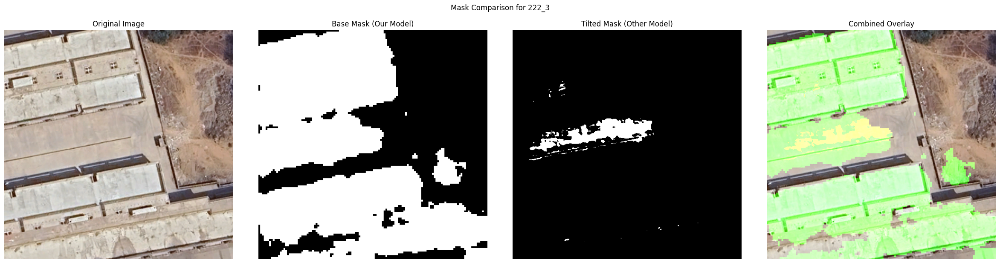

✅ Saved mask comparison visualization for 222_3 to Solar_Potential_Estimation/visualization_samples/222_3_mask_comparison.png


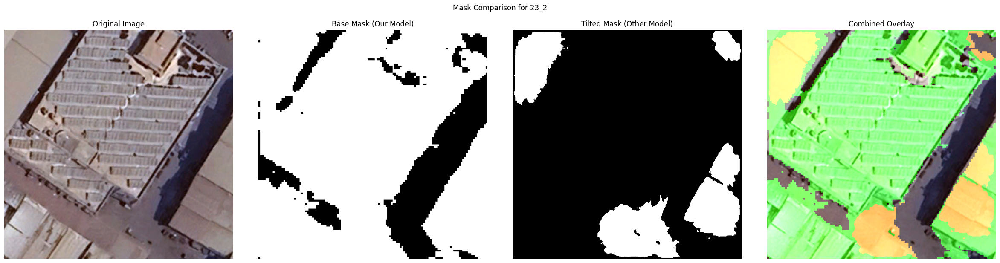

✅ Saved mask comparison visualization for 23_2 to Solar_Potential_Estimation/visualization_samples/23_2_mask_comparison.png


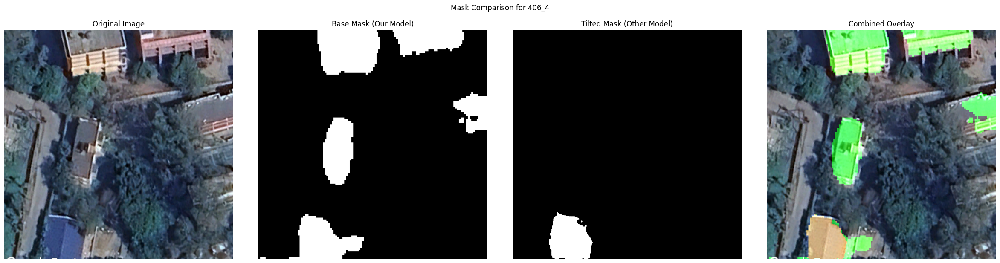

✅ Saved mask comparison visualization for 406_4 to Solar_Potential_Estimation/visualization_samples/406_4_mask_comparison.png


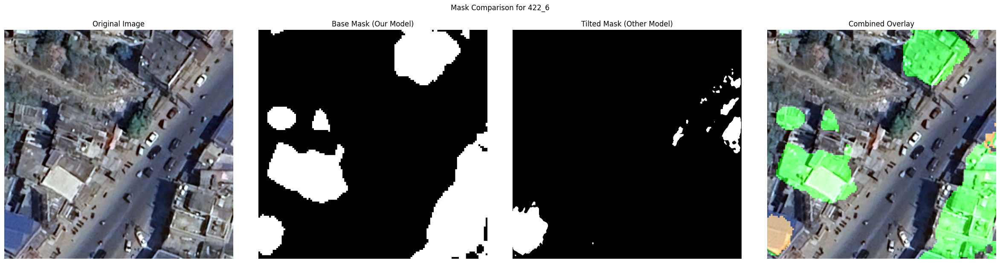

✅ Saved mask comparison visualization for 422_6 to Solar_Potential_Estimation/visualization_samples/422_6_mask_comparison.png


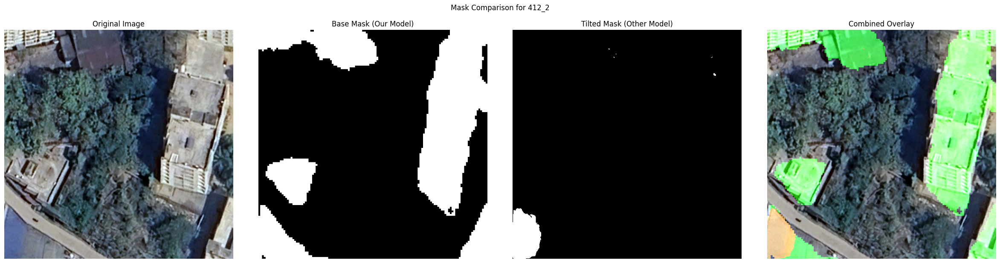

✅ Saved mask comparison visualization for 412_2 to Solar_Potential_Estimation/visualization_samples/412_2_mask_comparison.png

Mask comparison visualizations complete!


In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

# -------------------------
# CONFIG for Visualization
# -------------------------
# Directories (ensure these match the paths used in previous cells)
BASE_MASKS_DIR = "Solar_Potential_Estimation/raw_inference_masks/train" # Directory with masks from the general rooftop model (.npy)
TILTED_MASKS_DIR = "/content/drive/MyDrive/Resume/organized_inference_results/predictions" # Directory with masks from the tilted rooftop model (.png)
TRAIN_IMAGE_DIR = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images" # Directory with original images
VISUALIZATION_OUT_DIR = "Solar_Potential_Estimation/visualization_samples" # Directory to save the visualization plots

NUM_SAMPLES_TO_VISUALIZE = 5 # Number of samples to visualize

# -------------------------

# Create output directory
os.makedirs(VISUALIZATION_OUT_DIR, exist_ok=True)

# Get list of base mask files (assuming these correspond to training images)
base_mask_files = [f for f in os.listdir(BASE_MASKS_DIR) if f.lower().endswith(".npy")]

if not base_mask_files:
    print(f"[WARN] No .npy base mask files found in {BASE_MASKS_DIR}. Cannot generate visualizations.")
else:
    # Select a few random samples (or take the first N)
    samples_to_visualize = base_mask_files[:NUM_SAMPLES_TO_VISUALIZE]
    # Or use random.sample if you prefer random selection (requires import random)
    # import random
    # if len(base_mask_files) > NUM_SAMPLES_TO_VISUALIZE:
    #     samples_to_visualize = random.sample(base_mask_files, NUM_SAMPLES_TO_VISUALIZE)
    # else:
    #      samples_to_visualize = base_mask_files


    print(f"Generating visualizations for {len(samples_to_visualize)} sample images.")

    for base_mask_fname in samples_to_visualize:
        base_name = os.path.splitext(base_mask_fname)[0].replace('_mask', '') # Get base name

        # --- Load Assets ---
        base_mask_path = os.path.join(BASE_MASKS_DIR, base_mask_fname)
        tilted_mask_path = os.path.join(TILTED_MASKS_DIR, f"{base_name}_pred.png")
        original_image_path = None
        for ext in (".png", ".jpg", ".jpeg"):
            img_path = os.path.join(TRAIN_IMAGE_DIR, base_name + ext)
            if os.path.exists(img_path):
                original_image_path = img_path
                break

        if not os.path.exists(base_mask_path):
            print(f"[WARN] Base mask not found for {base_name}. Skipping.")
            continue

        base_mask = np.load(base_mask_path)
        if base_mask.dtype != np.uint8:
             base_mask = (base_mask > 0).astype(np.uint8)


        tilted_mask = None
        if os.path.exists(tilted_mask_path):
            tilted_mask_img = cv2.imread(tilted_mask_path, cv2.IMREAD_GRAYSCALE)
            if tilted_mask_img is not None:
                 tilted_mask = (tilted_mask_img > 0).astype(np.uint8)
            else:
                 print(f"[WARN] Could not load tilted mask image {tilted_mask_path}")

        original_image = None
        if original_image_path:
            original_image = cv2.imread(original_image_path)
            if original_image is not None:
                 original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
            else:
                 print(f"[WARN] Could not load original image {original_image_path}")

        # Ensure masks have consistent size with the original image if loaded
        if original_image is not None:
             orig_h, orig_w = original_image.shape[:2]
             if base_mask.shape[0] != orig_h or base_mask.shape[1] != orig_w:
                 base_mask = cv2.resize(base_mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
             if tilted_mask is not None and (tilted_mask.shape[0] != orig_h or tilted_mask.shape[1] != orig_w):
                 tilted_mask = cv2.resize(tilted_mask, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)
        elif base_mask is not None:
            # If no original image, use base mask size for tilted mask if needed
            if tilted_mask is not None and (tilted_mask.shape != base_mask.shape):
                 print(f"[WARN] Mask size mismatch for {base_name}. Resizing tilted mask to base mask size for visualization.")
                 tilted_mask = cv2.resize(tilted_mask, (base_mask.shape[1], base_mask.shape[0]), interpolation=cv2.INTER_NEAREST)


        # Create the combined overlay for visualization
        combined_overlay_image = None
        if original_image is not None:
            combined_overlay_image = original_image.copy()
            # Create visualization mask layers using the resized masks
            fully_usable_mask = cv2.bitwise_and(base_mask, cv2.bitwise_not(tilted_mask if tilted_mask is not None else np.zeros_like(base_mask)))
            overlap_mask = cv2.bitwise_and(base_mask, tilted_mask if tilted_mask is not None else np.zeros_like(base_mask))

            fully_color = (0, 255, 0) # Green for fully usable
            tilted_color = (255, 165, 0) # Orange for partially usable (tilted)
            alpha = 0.6

            fully_vis_mask_overlay = np.zeros_like(combined_overlay_image, dtype=np.uint8)
            tilted_vis_mask_overlay = np.zeros_like(combined_overlay_image, dtype=np.uint8)

            fully_vis_mask_overlay[fully_usable_mask > 0] = fully_color
            tilted_vis_mask_overlay[overlap_mask > 0] = tilted_color

            combined_overlay_image = cv2.addWeighted(combined_overlay_image, 1, fully_vis_mask_overlay, alpha, 0)
            combined_overlay_image = cv2.addWeighted(combined_overlay_image, 1, tilted_vis_mask_overlay, alpha, 0)


        # --- Create Plot ---
        num_subplots = 0
        if original_image is not None: num_subplots += 1
        if base_mask is not None: num_subplots += 1
        if tilted_mask is not None: num_subplots += 1
        if combined_overlay_image is not None: num_subplots += 1

        if num_subplots == 0:
            print(f"[WARN] No data available to plot for {base_name}. Skipping visualization.")
            continue

        fig, axes = plt.subplots(1, num_subplots, figsize=(num_subplots * 6, 6))

        # Ensure axes is always an array even for a single subplot
        if num_subplots == 1:
             axes = [axes]

        plot_idx = 0
        if original_image is not None:
             axes[plot_idx].imshow(original_image)
             axes[plot_idx].set_title("Original Image")
             axes[plot_idx].axis('off')
             plot_idx += 1

        if base_mask is not None:
             axes[plot_idx].imshow(base_mask, cmap='gray')
             axes[plot_idx].set_title("Base Mask (Our Model)")
             axes[plot_idx].axis('off')
             plot_idx += 1

        if tilted_mask is not None:
             axes[plot_idx].imshow(tilted_mask, cmap='gray')
             axes[plot_idx].set_title("Tilted Mask (Other Model)")
             axes[plot_idx].axis('off')
             plot_idx += 1

        if combined_overlay_image is not None:
             axes[plot_idx].imshow(combined_overlay_image)
             axes[plot_idx].set_title("Combined Overlay")
             axes[plot_idx].axis('off')
             plot_idx += 1


        plt.suptitle(f"Mask Comparison for {base_name}", y=1.02)
        plt.tight_layout()

        # Save and close plot
        vis_filename = os.path.join(VISUALIZATION_OUT_DIR, f"{base_name}_mask_comparison.png")
        plt.savefig(vis_filename, bbox_inches='tight')
        plt.show()
        plt.close(fig)

        print(f"✅ Saved mask comparison visualization for {base_name} to {vis_filename}")

    print("\nMask comparison visualizations complete!")

In [ ]:
import pandas as pd
import os

# Define the path to the Excel file
csv_path = "/content/drive/MyDrive/Results/image_total_solar_potential.csv" # Note: Name still says .csv but we'll read as excel

# Load the Excel file into a DataFrame
try:
    df = pd.read_excel(csv_path)
    print("✅ Successfully loaded the Excel file.")
    print("DataFrame head:")
    display(df.head())
    print(f"\nDataFrame shape: {df.shape}")
except FileNotFoundError:
    print(f"❌ Error: The file was not found at {csv_path}")
except Exception as e:
    print(f"❌ An error occurred while loading the Excel file: {e}")

✅ Successfully loaded the Excel file.
DataFrame head:


,Image_Name,Total_Solar_Potential_kWh_per_year
0,222_3,17440.2048
1,23_2,24108.5184
2,406_4,3590.6304
3,422_6,6155.3664
4,412_2,7181.2608



DataFrame shape: (360, 2)


In [ ]:
# Define the directory containing the training images
image_dir = "/content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images"

# Create a new column with the full path to each image file
df['image_path'] = df['Image_Name'].apply(lambda x: os.path.join(image_dir, f"{x}.png"))

# Verify that the paths exist for a few samples
print("Checking if image paths exist for the first 5 entries:")
for i, row in df.head().iterrows():
    path_exists = os.path.exists(row['image_path'])
    print(f"Image: {row['Image_Name']}.png, Path: {row['image_path']}, Exists: {path_exists}")

# Optional: Filter out rows where the image file does not exist
if not all(os.path.exists(p) for p in df['image_path']):
    print("\nWarning: Some image paths do not exist. Filtering out these entries.")
    df = df[df['image_path'].apply(os.path.exists)].reset_index(drop=True)
    print(f"New DataFrame shape after filtering: {df.shape}")

display(df.head())

Checking if image paths exist for the first 5 entries:
Image: 222_3.png, Path: /content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images/222_3.png, Exists: True
Image: 23_2.png, Path: /content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images/23_2.png, Exists: True
Image: 406_4.png, Path: /content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images/406_4.png, Exists: True
Image: 422_6.png, Path: /content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images/422_6.png, Exists: True
Image: 412_2.png, Path: /content/rooftop-solar-potential/Solar_Potential_Estimation/india_dataset/twoChannels_in/train/images/412_2.png, Exists: True


,Image_Name,Total_Solar_Potential_kWh_per_year,image_path
0,222_3,17440.2048,/content/rooftop-solar-potential/Solar_Potenti...
1,23_2,24108.5184,/content/rooftop-solar-potential/Solar_Potenti...
2,406_4,3590.6304,/content/rooftop-solar-potential/Solar_Potenti...
3,422_6,6155.3664,/content/rooftop-solar-potential/Solar_Potenti...
4,412_2,7181.2608,/content/rooftop-solar-potential/Solar_Potenti...


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split

class SolarPotentialDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        img_path = self.dataframe.iloc[idx]['image_path']
        # Load image and convert to RGB
        image = Image.open(img_path).convert('RGB')
        label = self.dataframe.iloc[idx]['Total_Solar_Potential_kWh_per_year']

        if self.transform:
            image = self.transform(image)

        # Convert label to a tensor
        label = torch.tensor(label, dtype=torch.float32)

        return image, label

# Define transforms (you might need to adjust these based on your image characteristics)
# Simple transforms for now: Resize and ToTensor
data_transforms = transforms.Compose([
    transforms.Resize((128, 128)), # Resize images to a fixed size (adjust as needed)
    transforms.ToTensor(),         # Convert PIL Image to PyTorch Tensor
    # Add more transforms if needed (e.g., Normalize)
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


train_df, val_df = train_test_split(df, test_size=0.2, random_state=42, shuffle=True)
val_df, test_df = train_test_split(val_df, test_size=0.25)

# Create dataset instances
train_dataset = SolarPotentialDataset(train_df, transform=data_transforms)
val_dataset = SolarPotentialDataset(val_df, transform=data_transforms)
test_dataset = SolarPotentialDataset(test_df, transform=data_transforms)

print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

# Example of accessing a sample
# img, label = train_dataset[0]
# print(f"Sample image tensor shape: {img.shape}")
# print(f"Sample label: {label.item()}")

Training dataset size: 288
Validation dataset size: 54
Test dataset size: 18


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets (85% train, 15% test initially)
train_df, test_df = train_test_split(df, test_size=0.15, random_state=42, shuffle=True)

# Split the test set into validation and test sets (10% validation, 5% test from original data)
# test_size = 0.05 / 0.15 = 1/3 of the current test_df
val_df, test_df = train_test_split(test_df, test_size=(5/15), random_state=42, shuffle=True)


print(f"Training data shape: {train_df.shape}")
print(f"Validation data shape: {val_df.shape}")
print(f"Test data shape: {test_df.shape}")

display(train_df.head())
display(val_df.head())
display(test_df.head())

Training data shape: (306, 3)
Validation data shape: (36, 3)
Test data shape: (18, 3)


,Image_Name,Total_Solar_Potential_kWh_per_year,image_path
333,423_4,11284.8384,/content/rooftop-solar-potential/Solar_Potenti...
283,220_3,15901.3632,/content/rooftop-solar-potential/Solar_Potenti...
3,422_6,6155.3664,/content/rooftop-solar-potential/Solar_Potenti...
116,407_2,9745.9968,/content/rooftop-solar-potential/Solar_Potenti...
76,220_1,11797.7856,/content/rooftop-solar-potential/Solar_Potenti...


,Image_Name,Total_Solar_Potential_kWh_per_year,image_path
232,18_6,17953.1520,/content/rooftop-solar-potential/Solar_Potenti...
148,405_3,11797.7856,/content/rooftop-solar-potential/Solar_Potenti...
286,6_1,9233.0496,/content/rooftop-solar-potential/Solar_Potenti...
126,418_2,3077.6832,/content/rooftop-solar-potential/Solar_Potenti...
124,223_6,4103.5776,/content/rooftop-solar-potential/Solar_Potenti...


,Image_Name,Total_Solar_Potential_kWh_per_year,image_path
356,3_2,3590.6304,/content/rooftop-solar-potential/Solar_Potenti...
342,12_5,12823.6800,/content/rooftop-solar-potential/Solar_Potenti...
45,3_1,7694.2080,/content/rooftop-solar-potential/Solar_Potenti...
210,20_2,17953.1520,/content/rooftop-solar-potential/Solar_Potenti...
157,20_3,21543.7824,/content/rooftop-solar-potential/Solar_Potenti...


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch # Ensure torch is imported for dummy tensor creation

class ImprovedCNNRegressor(nn.Module):
    def __init__(self, num_classes=1, input_image_size=(3, 128, 128)):
        super(ImprovedCNNRegressor, self).__init__()
        # Convolutional layers with Batch Normalization
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(256)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout = nn.Dropout(0.5)

        # Dynamically calculate the size of the flattened layer
        self._to_linear = self._get_conv_output(input_image_size)

        # Fully connected layers
        self.fc1 = nn.Linear(self._to_linear, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def _get_conv_output(self, shape):
        bs = 1
        input = torch.autograd.Variable(torch.rand(bs, *shape))
        output_feat = self._forward_features(input)
        n_size = output_feat.data.view(bs, -1).size(1)
        return n_size

    def _forward_features(self, x):
        # Forward pass through convolutional and pooling layers
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))
        return x

    def forward(self, x):
        # Forward pass through the entire network
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.pool(F.relu(self.bn4(self.conv4(x))))

        # Flatten the output for the fully connected layers
        x = x.view(-1, self._to_linear)

        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x) # Output layer (no activation for regression)
        return x

# Instantiate the improved model
# Assuming input image size is (3, 128, 128) based on data_transforms in cell 1db31d64
model = ImprovedCNNRegressor(input_image_size=(3, 128, 128))
print(model)

# Confirm the dynamically calculated size
dummy_input = torch.randn(1, 3, 128, 128)
dummy_output = model._forward_features(dummy_input)
calculated_to_linear = dummy_output.view(1, -1).size(1)
print(f"Calculated size before linear layers: {calculated_to_linear}")

ImprovedCNNRegressor(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=16384, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=1, bias=True)
)
Calculated size before linear layers: 16384


In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader

# Define hyperparameters
learning_rate = 0.001
batch_size = 32
num_epochs = 50 # You might need to adjust this based on training progress

# Define loss function (Mean Squared Error is common for regression)
criterion = nn.MSELoss()

# Define optimizer
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False) # Create test loader as well

print("Training setup complete: Loss function, Optimizer, and DataLoaders created.")

Training setup complete: Loss function, Optimizer, and DataLoaders created.


Using device: cuda
ℹ️ No existing model weights found at /content/drive/MyDrive/best_solar_potential_model.pth. Starting training from scratch.
Starting model training...


Epoch 1/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 1/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 167689597.6296
Epoch [1/50], Train Loss: 162941943.1111, Val Loss: 167689597.6296


Epoch 2/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 2/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 143939790.8148
Epoch [2/50], Train Loss: 130938442.6667, Val Loss: 143939790.8148


Epoch 3/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 3/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 105583167.7037
Epoch [3/50], Train Loss: 83440766.2222, Val Loss: 105583167.7037


Epoch 4/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 4/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 100236124.7407
Epoch [4/50], Train Loss: 37787527.7778, Val Loss: 100236124.7407


Epoch 5/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 5/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 22502518.5926
Epoch [5/50], Train Loss: 18813682.8889, Val Loss: 22502518.5926


Epoch 6/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 6/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [6/50], Train Loss: 19655851.0000, Val Loss: 31136459.8519


Epoch 7/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 7/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [7/50], Train Loss: 16296638.2222, Val Loss: 28967902.6667


Epoch 8/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 8/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 14991420.5556
Epoch [8/50], Train Loss: 14951848.3889, Val Loss: 14991420.5556


Epoch 9/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 9/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [9/50], Train Loss: 13687247.8333, Val Loss: 18947559.7407


Epoch 10/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 10/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [10/50], Train Loss: 12502365.1111, Val Loss: 38447196.6667


Epoch 11/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 11/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [11/50], Train Loss: 9432327.3333, Val Loss: 39965094.0741


Epoch 12/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 12/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 14227992.4444
Epoch [12/50], Train Loss: 10614395.3889, Val Loss: 14227992.4444


Epoch 13/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 13/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [13/50], Train Loss: 11784812.5556, Val Loss: 21606667.0370


Epoch 14/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 14/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 13697258.7037
Epoch [14/50], Train Loss: 10249783.2222, Val Loss: 13697258.7037


Epoch 15/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 15/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [15/50], Train Loss: 8208919.7778, Val Loss: 23331055.3333


Epoch 16/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 16/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [16/50], Train Loss: 9301770.6111, Val Loss: 20563518.7407


Epoch 17/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 17/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 12176721.7778
Epoch [17/50], Train Loss: 9504096.4722, Val Loss: 12176721.7778


Epoch 18/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 18/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [18/50], Train Loss: 7552068.1111, Val Loss: 26918149.7778


Epoch 19/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 19/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [19/50], Train Loss: 8024277.1111, Val Loss: 17907199.8519


Epoch 20/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 20/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [20/50], Train Loss: 6111160.8056, Val Loss: 19304635.2593


Epoch 21/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 21/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [21/50], Train Loss: 8907155.0556, Val Loss: 16699770.4444


Epoch 22/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 22/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [22/50], Train Loss: 6011998.8889, Val Loss: 16532882.2963


Epoch 23/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 23/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [23/50], Train Loss: 7119190.6667, Val Loss: 13301967.7037


Epoch 24/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 24/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [24/50], Train Loss: 6653841.3889, Val Loss: 18605974.5926


Epoch 25/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 25/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [25/50], Train Loss: 6162652.0556, Val Loss: 15805633.1852


Epoch 26/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 26/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [26/50], Train Loss: 4571790.1389, Val Loss: 14127532.6296


Epoch 27/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 27/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 11445043.4444
Epoch [27/50], Train Loss: 6231070.2778, Val Loss: 11445043.4444


Epoch 28/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 28/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [28/50], Train Loss: 4488639.5000, Val Loss: 45324701.7778


Epoch 29/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 29/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [29/50], Train Loss: 4517423.5694, Val Loss: 21027481.0741


Epoch 30/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 30/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [30/50], Train Loss: 5276218.4722, Val Loss: 13976853.5556


Epoch 31/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 31/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [31/50], Train Loss: 4131032.7778, Val Loss: 13006811.2593


Epoch 32/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 32/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [32/50], Train Loss: 5036554.2778, Val Loss: 51060900.1481


Epoch 33/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 33/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [33/50], Train Loss: 6603451.3333, Val Loss: 60263210.9630


Epoch 34/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 34/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [34/50], Train Loss: 6180384.9028, Val Loss: 17745736.0000


Epoch 35/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 35/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [35/50], Train Loss: 5644443.5556, Val Loss: 18592777.7778


Epoch 36/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 36/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [36/50], Train Loss: 5847871.5278, Val Loss: 34523006.3704


Epoch 37/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 37/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [37/50], Train Loss: 3754636.3056, Val Loss: 22967059.2593


Epoch 38/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 38/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [38/50], Train Loss: 4981327.1667, Val Loss: 12405748.9259


Epoch 39/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 39/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [39/50], Train Loss: 3949156.4306, Val Loss: 15569946.2963


Epoch 40/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 40/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [40/50], Train Loss: 4129067.6389, Val Loss: 12643861.0741


Epoch 41/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 41/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 11263071.7407
Epoch [41/50], Train Loss: 6225527.6111, Val Loss: 11263071.7407


Epoch 42/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 42/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [42/50], Train Loss: 4911065.2222, Val Loss: 21352363.1111


Epoch 43/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 43/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [43/50], Train Loss: 3305229.4306, Val Loss: 13626520.9630


Epoch 44/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 44/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [44/50], Train Loss: 2852149.3611, Val Loss: 12628727.7407


Epoch 45/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 45/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [45/50], Train Loss: 3846274.1111, Val Loss: 17798467.8519


Epoch 46/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 46/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [46/50], Train Loss: 3128688.5833, Val Loss: 33729079.4074


Epoch 47/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 47/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [47/50], Train Loss: 2276061.6111, Val Loss: 11607501.0741


Epoch 48/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 48/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [48/50], Train Loss: 1817128.3750, Val Loss: 15186487.8519


Epoch 49/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 49/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [49/50], Train Loss: 2034206.1806, Val Loss: 13642931.0741


Epoch 50/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 50/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [50/50], Train Loss: 2832516.5972, Val Loss: 15142107.4074

Training finished.


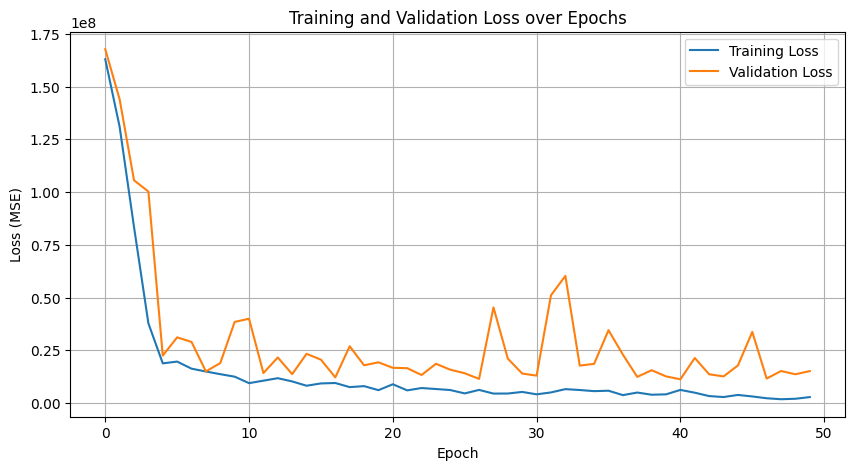

In [ ]:
# Move model to appropriate device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
print(f"Using device: {device}")

BEST_MODEL_PATH = '/content/drive/MyDrive/best_solar_potential_model.pth' # Define path to save best model

# Load best model weights if they exist
if os.path.exists(BEST_MODEL_PATH):
    try:
        model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
        print(f"✅ Loaded best model weights from {BEST_MODEL_PATH}")
    except Exception as e:
        print(f"❌ Could not load model weights from {BEST_MODEL_PATH}: {e}")
else:
    print(f"ℹ️ No existing model weights found at {BEST_MODEL_PATH}. Starting training from scratch.")


# Training loop
train_losses = []
val_losses = []
best_val_loss = float('inf') # Initialize with infinity


print("Starting model training...")

from tqdm.auto import tqdm # Import tqdm

for epoch in range(num_epochs):
    # Training phase
    model.train() # Set model to training mode
    running_loss = 0.0
    # Wrap train_loader with tqdm for progress bar
    train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)
    for images, labels in train_loader_tqdm:
        # Move data to device
        images = images.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)

        # Calculate loss
        # Ensure labels have the same shape as outputs if necessary (e.g., outputs is [batch_size, 1])
        loss = criterion(outputs.squeeze(), labels) # Use .squeeze() to match shapes if outputs is [batch_size, 1]

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0) # Accumulate batch loss, weighted by batch size
        train_loader_tqdm.set_postfix(loss=running_loss/((train_loader_tqdm.n + 1) * train_loader.batch_size)) # Update progress bar with current average loss


    epoch_train_loss = running_loss / len(train_dataset)
    train_losses.append(epoch_train_loss)


    # Validation phase
    model.eval() # Set model to evaluation mode
    running_val_loss = 0.0
    with torch.no_grad(): # Disable gradient calculation during validation
        # Wrap val_loader with tqdm for progress bar
        val_loader_tqdm = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", leave=False)
        for images, labels in val_loader_tqdm:
            # Move data to device
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Calculate loss
            val_loss = criterion(outputs.squeeze(), labels) # Use .squeeze() to match shapes

            running_val_loss += val_loss.item() * images.size(0) # Accumulate batch loss
            val_loader_tqdm.set_postfix(loss=running_val_loss/((val_loader_tqdm.n + 1) * val_loader.batch_size)) # Update progress bar with current average loss


    epoch_val_loss = running_val_loss / len(val_dataset)
    val_losses.append(epoch_val_loss)

    # Save best model based on validation loss
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"✅ Saved best model weights to {BEST_MODEL_PATH} with validation loss: {best_val_loss:.4f}")


    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")

print("\nTraining finished.")

# Optional: Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

Evaluating model on the test set...

--- Test Set Evaluation ---
Mean Squared Error (MSE): 9924710.0000
Root Mean Squared Error (RMSE): 3150.3508
Mean Absolute Error (MAE): 2454.4683
R-squared (R2): 0.8064
--------------------------


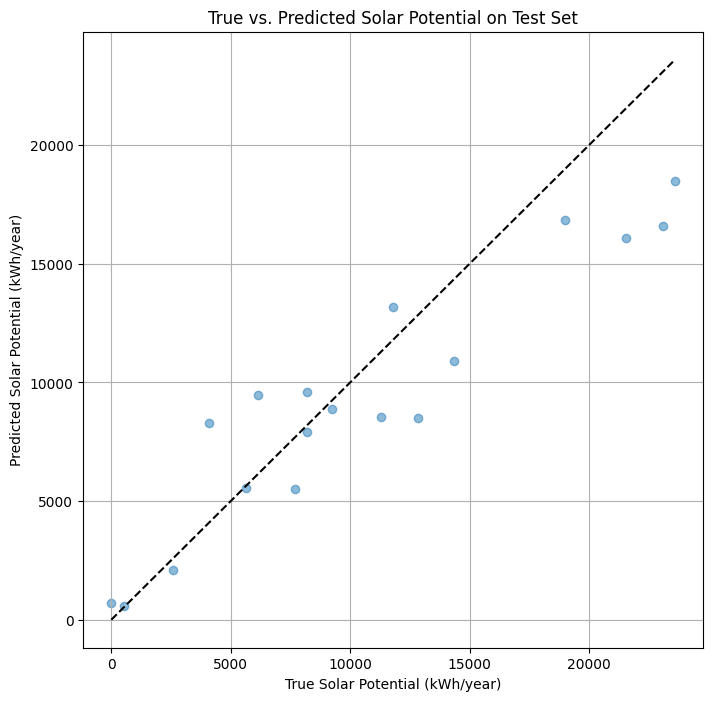

In [ ]:
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Set model to evaluation mode
model.eval()

test_predictions = []
test_true_labels = []

print("Evaluating model on the test set...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        # Collect predictions and true labels
        test_predictions.extend(outputs.squeeze().cpu().numpy())
        test_true_labels.extend(labels.cpu().numpy())

# Convert lists to numpy arrays
test_predictions = np.array(test_predictions)
test_true_labels = np.array(test_true_labels)

# Calculate evaluation metrics
mse = mean_squared_error(test_true_labels, test_predictions)
rmse = np.sqrt(mse) # Root Mean Squared Error
mae = mean_absolute_error(test_true_labels, test_predictions)
r2 = r2_score(test_true_labels, test_predictions) # R-squared

print("\n--- Test Set Evaluation ---")
# print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R2): {r2:.4f}")
print("--------------------------")

# Optional: Visualize predictions vs true labels
plt.figure(figsize=(8, 8))
plt.scatter(test_true_labels, test_predictions, alpha=0.5)
plt.xlabel("True Solar Potential (kWh/year)")
plt.ylabel("Predicted Solar Potential (kWh/year)")
plt.title("True vs. Predicted Solar Potential on Test Set")
plt.plot([min(test_true_labels), max(test_true_labels)], [min(test_true_labels), max(test_true_labels)], 'k--') # Diagonal line
plt.grid(True)
plt.show()

Evaluating model on the test set...

--- Test Set Evaluation ---
Root Mean Squared Error (RMSE): 2983.7860
Mean Absolute Error (MAE): 2262.7373
R-squared (R2): 0.8263
--------------------------


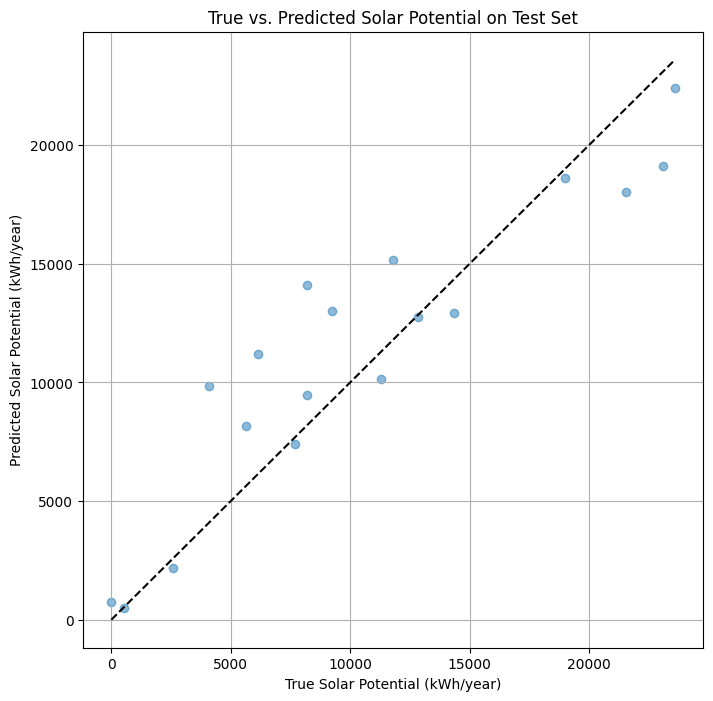

In [ ]:
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

BEST_MODEL_PATH_CUSTOM = '/content/drive/MyDrive/best_solar_potential_model.pth' # Define path

# Ensure the model is loaded with the best weights from the custom model training
model.load_state_dict(torch.load(BEST_MODEL_PATH_CUSTOM, map_location=device))
# Ensure model is on the correct device
model.to(device)

# Set model to evaluation mode
model.eval()

test_predictions = []
test_true_labels = []

print("Evaluating model on the test set...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        # Collect predictions and true labels
        test_predictions.extend(outputs.squeeze().cpu().numpy())
        test_true_labels.extend(labels.cpu().numpy())

# Convert lists to numpy arrays
test_predictions = np.array(test_predictions)
test_true_labels = np.array(test_true_labels)

# Calculate evaluation metrics
mse = mean_squared_error(test_true_labels, test_predictions)
rmse = np.sqrt(mse) # Root Mean Squared Error
mae = mean_absolute_error(test_true_labels, test_predictions)
r2 = r2_score(test_true_labels, test_predictions) # R-squared

print("\n--- Test Set Evaluation ---")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R2): {r2:.4f}")
print("--------------------------")

# Optional: Visualize predictions vs true labels
plt.figure(figsize=(8, 8))
plt.scatter(test_true_labels, test_predictions, alpha=0.5)
plt.xlabel("True Solar Potential (kWh/year)")
plt.ylabel("Predicted Solar Potential (kWh/year)")
plt.title("True vs. Predicted Solar Potential on Test Set")
plt.plot([min(test_true_labels), max(test_true_labels)], [min(test_true_labels), max(test_true_labels)], 'k--') # Diagonal line
plt.grid(True)
plt.show()

Using device: cuda
✅ Loaded best model weights from /content/drive/MyDrive/best_solar_potential_model.pth
Starting model training...


Epoch 1/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 1/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 105860918.5185
Epoch [1/50], Train Loss: 8355352.9444, Val Loss: 105860918.5185


Epoch 2/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 2/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 48334212.5926
Epoch [2/50], Train Loss: 6092860.6667, Val Loss: 48334212.5926


Epoch 3/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 3/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 15449996.1852
Epoch [3/50], Train Loss: 4781910.9444, Val Loss: 15449996.1852


Epoch 4/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 4/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [4/50], Train Loss: 4950228.3056, Val Loss: 20116663.7778


Epoch 5/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 5/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [5/50], Train Loss: 5007975.8194, Val Loss: 44319703.4074


Epoch 6/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 6/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 13099046.0741
Epoch [6/50], Train Loss: 4636987.0833, Val Loss: 13099046.0741


Epoch 7/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 7/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [7/50], Train Loss: 4737220.7222, Val Loss: 13909469.6667


Epoch 8/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 8/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [8/50], Train Loss: 4403987.2500, Val Loss: 62290874.0741


Epoch 9/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 9/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [9/50], Train Loss: 3157303.9444, Val Loss: 35196969.4815


Epoch 10/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 10/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [10/50], Train Loss: 3684347.3056, Val Loss: 14840417.6667


Epoch 11/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 11/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [11/50], Train Loss: 2901994.2361, Val Loss: 21684460.2963


Epoch 12/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 12/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [12/50], Train Loss: 3799804.4167, Val Loss: 42486452.4444


Epoch 13/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 13/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [13/50], Train Loss: 4170647.4722, Val Loss: 51161171.4074


Epoch 14/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 14/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 12747281.3333
Epoch [14/50], Train Loss: 3145053.7222, Val Loss: 12747281.3333


Epoch 15/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 15/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [15/50], Train Loss: 2190802.2639, Val Loss: 16090152.3704


Epoch 16/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 16/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 11194406.1111
Epoch [16/50], Train Loss: 3611016.8611, Val Loss: 11194406.1111


Epoch 17/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 17/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [17/50], Train Loss: 2733546.8750, Val Loss: 16256845.3704


Epoch 18/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 18/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

✅ Saved best model weights to /content/drive/MyDrive/best_solar_potential_model.pth with validation loss: 11084091.9630
Epoch [18/50], Train Loss: 3150596.0139, Val Loss: 11084091.9630


Epoch 19/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 19/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [19/50], Train Loss: 3817701.5000, Val Loss: 12086191.3704


Epoch 20/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 20/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [20/50], Train Loss: 2982124.4583, Val Loss: 14851125.7037


Epoch 21/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 21/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [21/50], Train Loss: 4488473.5139, Val Loss: 11761347.8889


Epoch 22/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 22/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [22/50], Train Loss: 3202841.5833, Val Loss: 28936091.7037


Epoch 23/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 23/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [23/50], Train Loss: 2723572.0000, Val Loss: 11772345.0370


Epoch 24/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 24/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [24/50], Train Loss: 3986598.3194, Val Loss: 23522147.7037


Epoch 25/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 25/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [25/50], Train Loss: 3527827.5833, Val Loss: 46908573.1852


Epoch 26/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 26/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [26/50], Train Loss: 4442533.9306, Val Loss: 19558727.2593


Epoch 27/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 27/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [27/50], Train Loss: 5598072.3611, Val Loss: 15629297.7037


Epoch 28/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 28/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [28/50], Train Loss: 2891575.1875, Val Loss: 13945457.9259


Epoch 29/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 29/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [29/50], Train Loss: 4223512.8750, Val Loss: 16653132.2222


Epoch 30/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 30/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [30/50], Train Loss: 3571627.2500, Val Loss: 76868487.1111


Epoch 31/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 31/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [31/50], Train Loss: 3523856.7083, Val Loss: 15682992.0000


Epoch 32/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 32/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [32/50], Train Loss: 2429785.9097, Val Loss: 16669433.5556


Epoch 33/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 33/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [33/50], Train Loss: 2827773.2222, Val Loss: 22083008.6667


Epoch 34/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 34/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [34/50], Train Loss: 2030514.2500, Val Loss: 16282585.0741


Epoch 35/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 35/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [35/50], Train Loss: 2711015.6806, Val Loss: 13151533.2222


Epoch 36/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 36/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [36/50], Train Loss: 2464709.9861, Val Loss: 11864414.9259


Epoch 37/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 37/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [37/50], Train Loss: 4278080.8750, Val Loss: 13793139.3333


Epoch 38/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 38/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [38/50], Train Loss: 2153099.1319, Val Loss: 15868967.2963


Epoch 39/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 39/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [39/50], Train Loss: 3008000.6944, Val Loss: 13258319.4815


Epoch 40/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 40/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [40/50], Train Loss: 3811380.7361, Val Loss: 15315811.8519


Epoch 41/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 41/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [41/50], Train Loss: 2658933.5694, Val Loss: 11807657.6667


Epoch 42/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 42/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [42/50], Train Loss: 3208487.5972, Val Loss: 13489285.1111


Epoch 43/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 43/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [43/50], Train Loss: 2207662.4167, Val Loss: 19449730.1481


Epoch 44/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 44/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [44/50], Train Loss: 3370494.3333, Val Loss: 23060716.9630


Epoch 45/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 45/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [45/50], Train Loss: 2823782.1667, Val Loss: 32774514.2222


Epoch 46/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 46/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [46/50], Train Loss: 2599382.7847, Val Loss: 12774041.1852


Epoch 47/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 47/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [47/50], Train Loss: 3685700.9722, Val Loss: 17867992.4444


Epoch 48/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 48/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [48/50], Train Loss: 2880834.3889, Val Loss: 17890575.4074


Epoch 49/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 49/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [49/50], Train Loss: 1690514.5278, Val Loss: 20754696.6667


Epoch 50/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 50/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [50/50], Train Loss: 2451428.4306, Val Loss: 14836293.9259

Training finished.


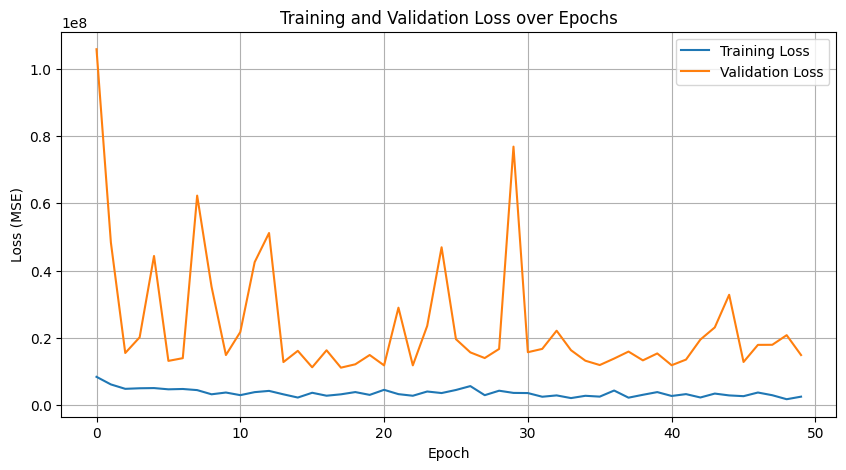

In [ ]:
# Move model to appropriate device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
print(f"Using device: {device}")

BEST_MODEL_PATH = '/content/drive/MyDrive/best_solar_potential_model.pth' # Define path to save best model

# Load best model weights if they exist
if os.path.exists(BEST_MODEL_PATH):
    try:
        model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
        print(f"✅ Loaded best model weights from {BEST_MODEL_PATH}")
    except Exception as e:
        print(f"❌ Could not load model weights from {BEST_MODEL_PATH}: {e}")
else:
    print(f"ℹ️ No existing model weights found at {BEST_MODEL_PATH}. Starting training from scratch.")


# Training loop
train_losses = []
val_losses = []
best_val_loss = float('inf') # Initialize with infinity


print("Starting model training...")

from tqdm.auto import tqdm # Import tqdm

for epoch in range(num_epochs):
    # Training phase
    model.train() # Set model to training mode
    running_loss = 0.0
    # Wrap train_loader with tqdm for progress bar
    train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)
    for images, labels in train_loader_tqdm:
        # Move data to device
        images = images.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)

        # Calculate loss
        # Ensure labels have the same shape as outputs if necessary (e.g., outputs is [batch_size, 1])
        loss = criterion(outputs.squeeze(), labels) # Use .squeeze() to match shapes if outputs is [batch_size, 1]

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0) # Accumulate batch loss, weighted by batch size
        train_loader_tqdm.set_postfix(loss=running_loss/((train_loader_tqdm.n + 1) * train_loader.batch_size)) # Update progress bar with current average loss


    epoch_train_loss = running_loss / len(train_dataset)
    train_losses.append(epoch_train_loss)


    # Validation phase
    model.eval() # Set model to evaluation mode
    running_val_loss = 0.0
    with torch.no_grad(): # Disable gradient calculation during validation
        # Wrap val_loader with tqdm for progress bar
        val_loader_tqdm = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", leave=False)
        for images, labels in val_loader_tqdm:
            # Move data to device
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Calculate loss
            val_loss = criterion(outputs.squeeze(), labels) # Use .squeeze() to match shapes

            running_val_loss += val_loss.item() * images.size(0) # Accumulate batch loss
            val_loader_tqdm.set_postfix(loss=running_val_loss/((val_loader_tqdm.n + 1) * val_loader.batch_size)) # Update progress bar with current average loss


    epoch_val_loss = running_val_loss / len(val_dataset)
    val_losses.append(epoch_val_loss)

    # Save best model based on validation loss
    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        torch.save(model.state_dict(), BEST_MODEL_PATH)
        print(f"✅ Saved best model weights to {BEST_MODEL_PATH} with validation loss: {best_val_loss:.4f}")


    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")

print("\nTraining finished.")

# Optional: Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

Evaluating model on the test set...

--- Test Set Evaluation ---
Root Mean Squared Error (RMSE): 3180.5830
Mean Absolute Error (MAE): 2298.5005
R-squared (R2): 0.8026
--------------------------


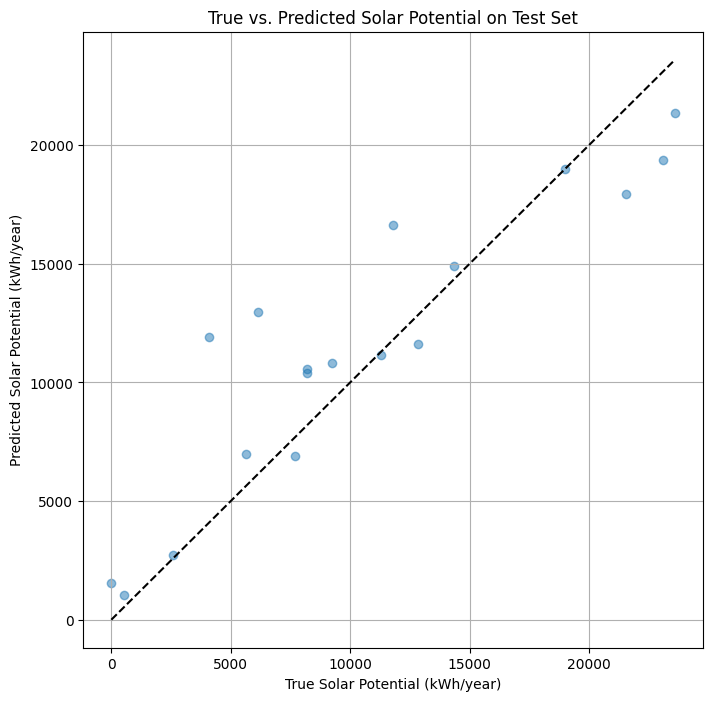

In [ ]:
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

BEST_MODEL_PATH_CUSTOM = '/content/drive/MyDrive/best_solar_potential_model.pth' # Define path

# Ensure the model is loaded with the best weights from the custom model training
model.load_state_dict(torch.load(BEST_MODEL_PATH_CUSTOM, map_location=device))
# Ensure model is on the correct device
model.to(device)

# Set model to evaluation mode
model.eval()

test_predictions = []
test_true_labels = []

print("Evaluating model on the test set...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        # Collect predictions and true labels
        test_predictions.extend(outputs.squeeze().cpu().numpy())
        test_true_labels.extend(labels.cpu().numpy())

# Convert lists to numpy arrays
test_predictions = np.array(test_predictions)
test_true_labels = np.array(test_true_labels)

# Calculate evaluation metrics
mse = mean_squared_error(test_true_labels, test_predictions)
rmse = np.sqrt(mse) # Root Mean Squared Error
mae = mean_absolute_error(test_true_labels, test_predictions)
r2 = r2_score(test_true_labels, test_predictions) # R-squared

print("\n--- Test Set Evaluation ---")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R2): {r2:.4f}")
print("--------------------------")

# Optional: Visualize predictions vs true labels
plt.figure(figsize=(8, 8))
plt.scatter(test_true_labels, test_predictions, alpha=0.5)
plt.xlabel("True Solar Potential (kWh/year)")
plt.ylabel("Predicted Solar Potential (kWh/year)")
plt.title("True vs. Predicted Solar Potential on Test Set")
plt.plot([min(test_true_labels), max(test_true_labels)], [min(test_true_labels), max(test_true_labels)], 'k--') # Diagonal line
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
import os

# Define the path to the CSV file
csv_path = "/content/drive/MyDrive/Solar_Potential_Combined_Results/image_total_solar_potential.csv"

# Load the CSV file into a DataFrame
try:
    df_sklearn = pd.read_excel(csv_path)
    print("✅ Successfully loaded the CSV file for scikit-learn pipeline.")
    print("DataFrame head:")
    display(df_sklearn.head())
    print(f"\nDataFrame shape: {df_sklearn.shape}")
except FileNotFoundError:
    print(f"❌ Error: The file was not found at {csv_path}")
except Exception as e:
    print(f"❌ An error occurred while loading the CSV: {e}")

df_sklearn = df
df_sklearn.head()

❌ Error: The file was not found at /content/drive/MyDrive/Solar_Potential_Combined_Results/image_total_solar_potential.csv


,Image_Name,Total_Solar_Potential_kWh_per_year,image_path
0,222_3,17440.2048,/content/rooftop-solar-potential/Solar_Potenti...
1,23_2,24108.5184,/content/rooftop-solar-potential/Solar_Potenti...
2,406_4,3590.6304,/content/rooftop-solar-potential/Solar_Potenti...
3,422_6,6155.3664,/content/rooftop-solar-potential/Solar_Potenti...
4,412_2,7181.2608,/content/rooftop-solar-potential/Solar_Potenti...


In [ ]:

# Define the directory containing the training images
image_dir = "/content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images"

# Create a new column with the full path to each image file
df_sklearn['image_path'] = df_sklearn['Image_Name'].apply(lambda x: os.path.join(image_dir, f"{x}.png"))

# Verify that the paths exist for a few samples
print("Checking if image paths exist for the first 5 entries:")
for i, row in df_sklearn.head().iterrows():
    path_exists = os.path.exists(row['image_path'])
    print(f"Image: {row['Image_Name']}.png, Path: {row['image_path']}, Exists: {path_exists}")

# Optional: Filter out rows where the image file does not exist
if not all(os.path.exists(p) for p in df_sklearn['image_path']):
    print("\nWarning: Some image paths do not exist. Filtering out these entries.")
    df_sklearn = df_sklearn[df_sklearn['image_path'].apply(os.path.exists)].reset_index(drop=True)
    print(f"New DataFrame shape after filtering: {df_sklearn.shape}")

display(df_sklearn.head())

Checking if image paths exist for the first 5 entries:
Image: 222_3.png, Path: /content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images/222_3.png, Exists: True
Image: 23_2.png, Path: /content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images/23_2.png, Exists: True
Image: 406_4.png, Path: /content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images/406_4.png, Exists: True
Image: 422_6.png, Path: /content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images/422_6.png, Exists: True
Image: 412_2.png, Path: /content/drive/MyDrive/Roof dataset/india_dataset/twoChannels_in/train/images/412_2.png, Exists: True


,Image_Name,Total_Solar_Potential_kWh_per_year,image_path
0,222_3,17440.2048,/content/drive/MyDrive/Roof dataset/india_data...
1,23_2,24108.5184,/content/drive/MyDrive/Roof dataset/india_data...
2,406_4,3590.6304,/content/drive/MyDrive/Roof dataset/india_data...
3,422_6,6155.3664,/content/drive/MyDrive/Roof dataset/india_data...
4,412_2,7181.2608,/content/drive/MyDrive/Roof dataset/india_data...


In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
from tqdm.auto import tqdm

# Define the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Load a pre-trained model (e.g., ResNet18)
# We will remove the final classification layer to use it as a feature extractor
model_ft = models.resnet18(weights='ResNet18_Weights.DEFAULT')
# Remove the fully connected layer
num_ftrs = model_ft.fc.in_features
model_ft.fc = torch.nn.Identity() # Replace the fc layer with Identity

model_ft = model_ft.to(device)
model_ft.eval() # Set the model to evaluation mode

# Define image transformations for the pre-trained model
# These should match the expected input of the pre-trained model
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Function to extract features from an image
def extract_features(image_path, model, preprocess, device):
    try:
        image = Image.open(image_path).convert('RGB')
        image_tensor = preprocess(image)
        image_tensor = image_tensor.unsqueeze(0) # Add batch dimension
        image_tensor = image_tensor.to(device)

        with torch.no_grad():
            features = model(image_tensor)

        return features.squeeze().cpu().numpy() # Remove batch dimension and move to CPU
    except Exception as e:
        print(f"Error extracting features from {image_path}: {e}")
        return None # Return None if feature extraction fails


# Extract features for all images in the DataFrame
all_features = []
valid_image_names = []
valid_solar_potential = []


print("Extracting features from images...")
# Iterate through the DataFrame and extract features
for index, row in tqdm(df_sklearn.iterrows(), total=len(df_sklearn), desc="Extracting Features"):
    image_path = row['image_path']
    solar_potential = row['Total_Solar_Potential_kWh_per_year']

    features = extract_features(image_path, model_ft, preprocess, device)

    if features is not None:
        all_features.append(features)
        valid_image_names.append(row['Image_Name'])
        valid_solar_potential.append(solar_potential)

# Convert the list of features to a NumPy array
all_features = np.array(all_features)
valid_solar_potential = np.array(valid_solar_potential)

print("\nFeature extraction complete.")
print(f"Shape of extracted features: {all_features.shape}")
print(f"Number of valid samples: {len(valid_solar_potential)}")

# Update the DataFrame to include only valid samples if any failed
if len(valid_image_names) < len(df_sklearn):
    print("Warning: Some images failed feature extraction. Updating DataFrame.")
    df_sklearn_processed = pd.DataFrame({
        'Image_Name': valid_image_names,
        'Total_Solar_Potential_kWh_per_year': valid_solar_potential
    })
    # Keep the original image_path column for consistency if needed later, but it's not used for training
    # You might want to merge with the original df_sklearn if you need other columns
    print(f"New DataFrame shape after excluding failed samples: {df_sklearn_processed.shape}")
else:
    df_sklearn_processed = df_sklearn.copy() # Use the original if all succeeded

# The extracted features (all_features) and labels (valid_solar_potential) are now ready for splitting and training with scikit-learn.

Using device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 183MB/s]


Extracting features from images...


Extracting Features:   0%|          | 0/360 [00:00<?, ?it/s]


Feature extraction complete.
Shape of extracted features: (360, 512)
Number of valid samples: 360


In [ ]:
# The extracted features are in 'all_features' numpy array
# The corresponding labels are in 'valid_solar_potential' numpy array

# You can now use all_features as your feature matrix (X)
# and valid_solar_potential as your target vector (y)

print(f"Feature matrix shape (X): {all_features.shape}")
print(f"Target vector shape (y): {valid_solar_potential.shape}")

# The data is now ready for splitting and training with scikit-learn.

Feature matrix shape (X): (360, 512)
Target vector shape (y): (360,)


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming 'all_features' is your feature matrix (X) and 'valid_solar_potential' is your target vector (y)

# Split the data into training and temporary test sets (85% train, 15% test initially)
X_train, X_temp, y_train, y_temp = train_test_split(
    all_features, valid_solar_potential, test_size=0.15, random_state=42, shuffle=True
)

# Split the temporary test set into validation and final test sets (10% val, 5% test from original data)
# The test_size here is relative to the temporary test set (y_temp)
# 5% of original data / 15% of original data = 1/3
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=(5/15), random_state=42, shuffle=True
)

print(f"Training features shape (X_train): {X_train.shape}")
print(f"Training labels shape (y_train): {y_train.shape}")
print(f"Validation features shape (X_val): {X_val.shape}")
print(f"Validation labels shape (y_val): {y_val.shape}")
print(f"Test features shape (X_test): {X_test.shape}")
print(f"Test labels shape (y_test): {y_test.shape}")

Training features shape (X_train): (306, 512)
Training labels shape (y_train): (306,)
Validation features shape (X_val): (36, 512)
Validation labels shape (y_val): (36,)
Test features shape (X_test): (18, 512)
Test labels shape (y_test): (18,)


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Choose a scikit-learn regression model (e.g., RandomForestRegressor)
# You can experiment with other models like SVR, GradientBoostingRegressor, etc.
model_sklearn = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1) # n_estimators can be tuned

print("Starting scikit-learn model training...")

# Train the model on the training data (extracted features and solar potential labels)
model_sklearn.fit(X_train, y_train)

print("Scikit-learn model training finished.")

# Optional: Evaluate on the validation set after training
val_predictions_sklearn = model_sklearn.predict(X_val)

mse_val_sklearn = mean_squared_error(y_val, val_predictions_sklearn)
rmse_val_sklearn = np.sqrt(mse_val_sklearn)
mae_val_sklearn = mean_absolute_error(y_val, val_predictions_sklearn)
r2_val_sklearn = r2_score(y_val, val_predictions_sklearn)

print("\n--- Validation Set Evaluation (scikit-learn) ---")
print(f"Mean Squared Error (MSE): {mse_val_sklearn:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_val_sklearn:.4f}")
print(f"Mean Absolute Error (MAE): {mae_val_sklearn:.4f}")
print(f"R-squared (R2): {r2_val_sklearn:.4f}")
print("-------------------------------------------------")

Starting scikit-learn model training...
Scikit-learn model training finished.

--- Validation Set Evaluation (scikit-learn) ---
Mean Squared Error (MSE): 24482905.0943
Root Mean Squared Error (RMSE): 4948.0203
Mean Absolute Error (MAE): 3750.2140
R-squared (R2): 0.5551
-------------------------------------------------



--- Test Set Evaluation (scikit-learn) ---
Mean Squared Error (MSE): 17878813.4901
Root Mean Squared Error (RMSE): 4228.3346
Mean Absolute Error (MAE): 3351.2550
R-squared (R2): 0.5226
------------------------------------------


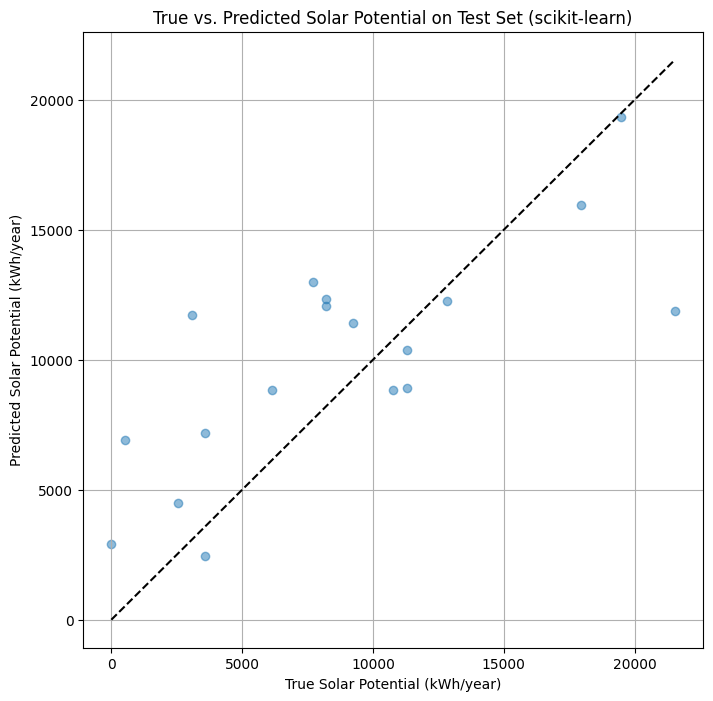

In [ ]:
# Evaluate the trained scikit-learn model on the test set
test_predictions_sklearn = model_sklearn.predict(X_test)

# Calculate evaluation metrics on the test set
mse_test_sklearn = mean_squared_error(y_test, test_predictions_sklearn)
rmse_test_sklearn = np.sqrt(mse_test_sklearn)
mae_test_sklearn = mean_absolute_error(y_test, test_predictions_sklearn)
r2_test_sklearn = r2_score(y_test, test_predictions_sklearn)

print("\n--- Test Set Evaluation (scikit-learn) ---")
print(f"Mean Squared Error (MSE): {mse_test_sklearn:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_test_sklearn:.4f}")
print(f"Mean Absolute Error (MAE): {mae_test_sklearn:.4f}")
print(f"R-squared (R2): {r2_test_sklearn:.4f}")
print("------------------------------------------")

# Optional: Visualize predictions vs true labels on the test set
plt.figure(figsize=(8, 8))
plt.scatter(y_test, test_predictions_sklearn, alpha=0.5)
plt.xlabel("True Solar Potential (kWh/year)")
plt.ylabel("Predicted Solar Potential (kWh/year)")
plt.title("True vs. Predicted Solar Potential on Test Set (scikit-learn)")
# Add a diagonal line for reference
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--')
plt.grid(True)
plt.show()

In [ ]:
import joblib
import os

# Define the path to save the scikit-learn model in your Google Drive
SKLEARN_MODEL_PATH = '/content/drive/MyDrive/best_solar_potential_sklearn_model.joblib' # You can change the filename

# Ensure the directory exists (if it's a new path)
# os.makedirs(os.path.dirname(SKLEARN_MODEL_PATH), exist_ok=True) # Uncomment if saving to a new directory

# Save the trained scikit-learn model
try:
    joblib.dump(model_sklearn, SKLEARN_MODEL_PATH)
    print(f"✅ Successfully saved scikit-learn model to {SKLEARN_MODEL_PATH}")
except Exception as e:
    print(f"❌ Error saving scikit-learn model: {e}")

✅ Successfully saved scikit-learn model to /content/drive/MyDrive/best_solar_potential_sklearn_model.joblib


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
import torch

class CustomCNNRegressor(nn.Module):
    def __init__(self, num_classes=1, input_image_size=(3, 128, 128)):
        super(CustomCNNRegressor, self).__init__()
        # Different convolutional layers (e.g., wider or fewer layers)
        self.conv1 = nn.Conv2d(3, 64, kernel_size=5, padding=2) # Larger kernel
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout = nn.Dropout(0.5) # Dropout included as requested

        self._to_linear = self._get_conv_output(input_image_size)

        self.fc1 = nn.Linear(self._to_linear, 256) # Smaller FC layer
        self.fc2 = nn.Linear(256, num_classes)

    def _get_conv_output(self, shape):
        bs = 1
        input = torch.autograd.Variable(torch.rand(bs, *shape))
        output_feat = self._forward_features(input)
        n_size = output_feat.data.view(bs, -1).size(1)
        return n_size

    def _forward_features(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        return x

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))

        x = x.view(-1, self._to_linear)

        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Instantiate the new custom model
new_model = CustomCNNRegressor(input_image_size=(3, 128, 128))
print(new_model)

# Confirm dynamic size calculation
dummy_input = torch.randn(1, 3, 128, 128)
dummy_output = new_model._forward_features(dummy_input)
calculated_to_linear = dummy_output.view(1, -1).size(1)
print(f"Calculated size before linear layers: {calculated_to_linear}")

# Assign this new model to the 'model' variable for subsequent cells
model = new_model

CustomCNNRegressor(
  (conv1): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc1): Linear(in_features=131072, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=1, bias=True)
)
Calculated size before linear layers: 131072


✅ Loaded best model weights from /content/drive/MyDrive/best_custom_cnn_regressor_model.pth. Resuming training.
Initial validation loss after loading checkpoint: 13456299.1111
Starting model training...


Epoch 1/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 1/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [1/50], Train Loss: 13949696.7778, Val Loss: 23847138.9630


Epoch 2/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 2/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [2/50], Train Loss: 14429583.1111, Val Loss: 64983373.6296


Epoch 3/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 3/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [3/50], Train Loss: 14564544.8889, Val Loss: 57638605.9259


Epoch 4/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 4/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [4/50], Train Loss: 13809884.9444, Val Loss: 25783199.3333


Epoch 5/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 5/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [5/50], Train Loss: 12014805.9444, Val Loss: 84982921.7778


Epoch 6/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 6/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [6/50], Train Loss: 13749949.7778, Val Loss: 78174172.4444


Epoch 7/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 7/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [7/50], Train Loss: 14899425.3333, Val Loss: 16706264.4444


Epoch 8/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 8/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [8/50], Train Loss: 11730704.8889, Val Loss: 35765910.9630


Epoch 9/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 9/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [9/50], Train Loss: 12905997.7778, Val Loss: 25498988.5185


Epoch 10/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 10/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [10/50], Train Loss: 11618671.3333, Val Loss: 21794602.9630


Epoch 11/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 11/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [11/50], Train Loss: 11625998.7778, Val Loss: 18637934.8148


Epoch 12/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 12/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [12/50], Train Loss: 11116826.7778, Val Loss: 17651856.3704


Epoch 13/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 13/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [13/50], Train Loss: 10843221.7222, Val Loss: 18953549.1852


Epoch 14/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 14/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [14/50], Train Loss: 10338214.2222, Val Loss: 15416444.4444


Epoch 15/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 15/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [15/50], Train Loss: 10737451.2222, Val Loss: 77132017.4815


Epoch 16/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 16/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [16/50], Train Loss: 9653326.2778, Val Loss: 349349393.7778


Epoch 17/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 17/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [17/50], Train Loss: 11185054.8889, Val Loss: 28758760.5185


Epoch 18/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 18/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [18/50], Train Loss: 9688251.7222, Val Loss: 42280650.9630


Epoch 19/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 19/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [19/50], Train Loss: 11051707.0556, Val Loss: 47759094.8148


Epoch 20/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 20/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [20/50], Train Loss: 10235933.6667, Val Loss: 18998399.9259


Epoch 21/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 21/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [21/50], Train Loss: 9428423.2222, Val Loss: 40419591.7037


Epoch 22/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 22/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [22/50], Train Loss: 8023583.5556, Val Loss: 44161601.0370


Epoch 23/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 23/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [23/50], Train Loss: 8387238.7222, Val Loss: 267772669.6296


Epoch 24/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 24/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [24/50], Train Loss: 9701498.6667, Val Loss: 17882999.7037


Epoch 25/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 25/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [25/50], Train Loss: 8119736.0556, Val Loss: 15844360.3704


Epoch 26/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 26/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [26/50], Train Loss: 8173061.9722, Val Loss: 17773873.7037


Epoch 27/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 27/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [27/50], Train Loss: 11243420.6667, Val Loss: 22255663.8519


Epoch 28/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 28/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [28/50], Train Loss: 9424114.2222, Val Loss: 24913212.7407


Epoch 29/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 29/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [29/50], Train Loss: 8105488.2222, Val Loss: 17812176.6667


Epoch 30/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 30/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [30/50], Train Loss: 7119817.9444, Val Loss: 55299013.9259


Epoch 31/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 31/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [31/50], Train Loss: 6114689.0556, Val Loss: 18755677.7778


Epoch 32/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 32/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [32/50], Train Loss: 7706374.5556, Val Loss: 30872512.4444


Epoch 33/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 33/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [33/50], Train Loss: 7088475.7222, Val Loss: 29470688.7407


Epoch 34/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 34/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [34/50], Train Loss: 6370422.5278, Val Loss: 17115277.1111


Epoch 35/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 35/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [35/50], Train Loss: 6453296.5000, Val Loss: 103045770.6667


Epoch 36/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 36/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [36/50], Train Loss: 7528218.2778, Val Loss: 26275396.2222


Epoch 37/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 37/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [37/50], Train Loss: 6568779.1389, Val Loss: 25696253.9259


Epoch 38/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 38/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [38/50], Train Loss: 6878865.7222, Val Loss: 18874064.5185


Epoch 39/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 39/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [39/50], Train Loss: 5646232.8889, Val Loss: 22953348.2222


Epoch 40/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 40/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [40/50], Train Loss: 4938807.5556, Val Loss: 53938516.1481


Epoch 41/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 41/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [41/50], Train Loss: 5141557.0278, Val Loss: 37337616.4444


Epoch 42/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 42/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [42/50], Train Loss: 4945002.8889, Val Loss: 17434075.7037


Epoch 43/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 43/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [43/50], Train Loss: 6220270.1667, Val Loss: 19167133.9259


Epoch 44/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 44/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [44/50], Train Loss: 4688891.8611, Val Loss: 48335505.7778


Epoch 45/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 45/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [45/50], Train Loss: 5151427.8056, Val Loss: 25460694.6667


Epoch 46/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 46/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [46/50], Train Loss: 5168645.0000, Val Loss: 18898212.6667


Epoch 47/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 47/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [47/50], Train Loss: 5530933.6944, Val Loss: 97721932.4444


Epoch 48/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 48/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [48/50], Train Loss: 6559636.5000, Val Loss: 25348273.0370


Epoch 49/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 49/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [49/50], Train Loss: 6184742.1111, Val Loss: 23191866.0741


Epoch 50/50 [Train]:   0%|          | 0/9 [00:00<?, ?it/s]

Epoch 50/50 [Val]:   0%|          | 0/2 [00:00<?, ?it/s]

Epoch [50/50], Train Loss: 5304643.8333, Val Loss: 23015915.1111

Training finished.


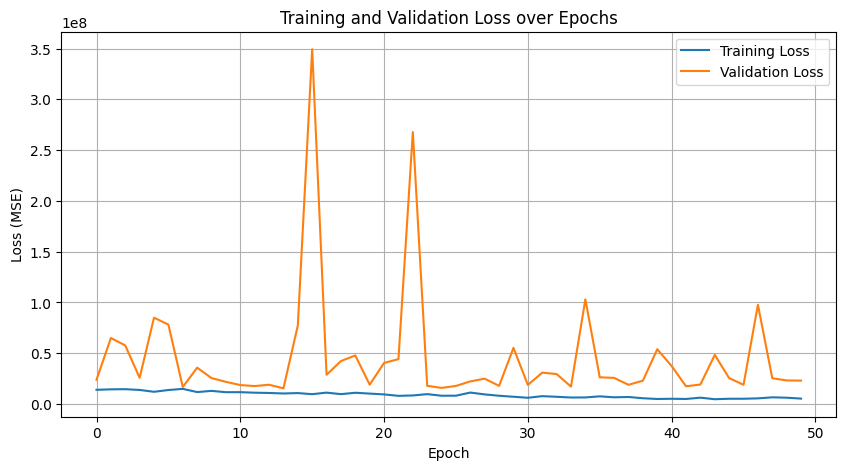

In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import os
from tqdm.auto import tqdm # Import tqdm

def train_model(model, device, train_loader, val_loader, criterion, optimizer, num_epochs, best_model_path):
    model.to(device)
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')

    # Check if a best model already exists and load it
    if os.path.exists(best_model_path):
        try:
            model.load_state_dict(torch.load(best_model_path, map_location=device))
            print(f"✅ Loaded best model weights from {best_model_path}. Resuming training.")
            # Evaluate the loaded model to set initial best_val_loss
            model.eval()
            running_val_loss_loaded = 0.0
            with torch.no_grad():
                for images, labels in val_loader:
                    images = images.to(device)
                    labels = labels.to(device)
                    outputs = model(images)
                    val_loss_loaded = criterion(outputs.squeeze(), labels)
                    running_val_loss_loaded += val_loss_loaded.item() * images.size(0)
            best_val_loss = running_val_loss_loaded / len(val_loader.dataset)
            print(f"Initial validation loss after loading checkpoint: {best_val_loss:.4f}")
        except Exception as e:
            print(f"❌ Could not load model weights from {best_model_path}: {e}. Starting training from scratch.")
    else:
        print(f"ℹ️ No existing model weights found at {best_model_path}. Starting training from scratch.")


    print("Starting model training...")

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        train_loader_tqdm = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]", leave=False)
        for images, labels in train_loader_tqdm:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs.squeeze(), labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            train_loader_tqdm.set_postfix(loss=running_loss/((train_loader_tqdm.n + 1) * train_loader.batch_size))

        epoch_train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)

        # Validation phase
        model.eval()
        running_val_loss = 0.0
        with torch.no_grad():
            val_loader_tqdm = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]", leave=False)
            for images, labels in val_loader_tqdm:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                val_loss = criterion(outputs.squeeze(), labels)

                running_val_loss += val_loss.item() * images.size(0)
                val_loader_tqdm.set_postfix(loss=running_val_loss/((val_loader_tqdm.n + 1) * val_loader.batch_size))

        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)

        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            torch.save(model.state_dict(), best_model_path)
            print(f"✅ Saved best model weights to {best_model_path} with validation loss: {best_val_loss:.4f}")

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")

    print("\nTraining finished.")

    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss (MSE)')
    plt.title('Training and Validation Loss over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

    return model, train_losses, val_losses

# Define hyperparameters
learning_rate = 0.001
batch_size = 32
num_epochs = 50 # You might need to adjust this

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Define path to save best model
BEST_MODEL_PATH_CUSTOM = '/content/drive/MyDrive/best_custom_cnn_regressor_model.pth' # New path for the custom model

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Train the model
trained_model, train_history, val_history = train_model(
    model, device, train_loader, val_loader, criterion, optimizer, num_epochs, BEST_MODEL_PATH_CUSTOM
)

Evaluating custom CNN model on the test set...

--- Custom CNN Test Set Evaluation ---
Mean Squared Error (MSE): 13368205.0000
Root Mean Squared Error (RMSE): 3656.2556
Normalized RMSE (nRMSE): 34.68%
Mean Absolute Error (MAE): 2931.8799
R-squared (R2): 0.7392
--------------------------------------


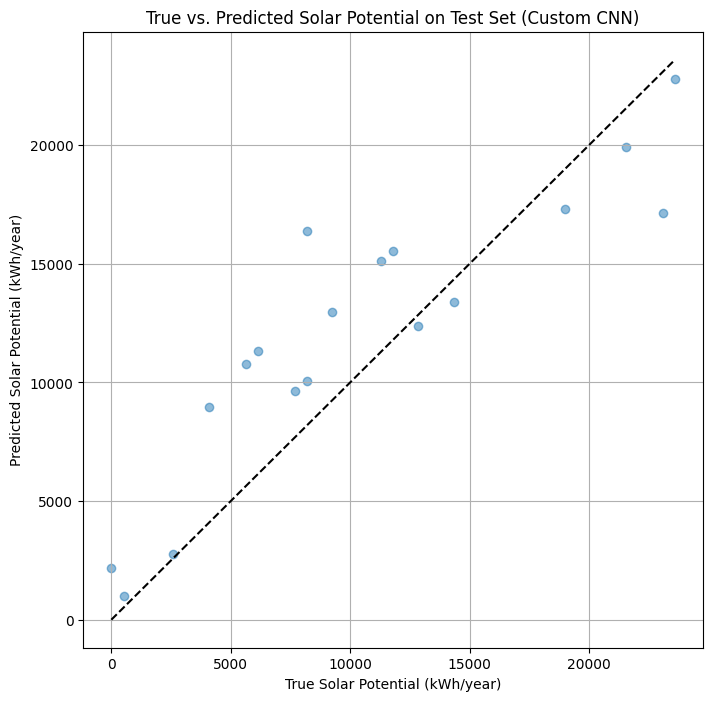

In [ ]:
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Ensure the model is loaded with the best weights from the custom model training
model.load_state_dict(torch.load(BEST_MODEL_PATH_CUSTOM, map_location=device))

# Set model to evaluation mode
model.eval()

test_predictions = []
test_true_labels = []

print("Evaluating custom CNN model on the test set...")

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        # Collect predictions and true labels
        test_predictions.extend(outputs.squeeze().cpu().numpy())
        test_true_labels.extend(labels.cpu().numpy())

# Convert lists to numpy arrays
test_predictions = np.array(test_predictions)
test_true_labels = np.array(test_true_labels)

# Calculate evaluation metrics
mse = mean_squared_error(test_true_labels, test_predictions)
rmse = np.sqrt(mse) # Root Mean Squared Error
mae = mean_absolute_error(test_true_labels, test_predictions)
r2 = r2_score(test_true_labels, test_predictions) # R-squared

# Calculate Normalized RMSE (nRMSE)
mean_actual_values = np.mean(test_true_labels)
nrmse = (rmse / mean_actual_values) * 100 if mean_actual_values != 0 else np.nan

print("\n--- Custom CNN Test Set Evaluation ---")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Normalized RMSE (nRMSE): {nrmse:.2f}%")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R2): {r2:.4f}")
print("--------------------------------------")

# Visualize predictions vs true labels
plt.figure(figsize=(8, 8))
plt.scatter(test_true_labels, test_predictions, alpha=0.5)
plt.xlabel("True Solar Potential (kWh/year)")
plt.ylabel("Predicted Solar Potential (kWh/year)")
plt.title("True vs. Predicted Solar Potential on Test Set (Custom CNN)")
plt.plot([min(test_true_labels), max(test_true_labels)], [min(test_true_labels), max(test_true_labels)], 'k--') # Diagonal line
plt.grid(True)
plt.show()